# In-depth Analysis of Airbnb Dataset (Sentiment Analysis, Predictive Modelling, and Visualisation)
This work has been submitted in partial fulfilment of the requirements of the Masters Degree in Urban Data Science and Analytics of the University of Leeds.  
- Date of submission: 4 December 2023
- Authors: Aseem Shaikh, Chuangnan Liu, Subaru Shimizu, and Yuchi Lai 
- Grade: 52/60

**Disclaimer:**  
- This work is for educational and informational purposes only. The author makes no warranties or representations about the accuracy, reliability, or completeness of the code.
- The authors do not take any responsibility for any direct, indirect, incidental, or consequential damages and losses from the use of the work.
- The work is not to be reused, modified, or redistributed without explicit permission from the authors.

**Overview:**  
This work explores the dataset of Airbnb listings in London to provide insights about guest experiences and factors in price strategies with various visualisation tools.

***

# Project Plan

## Data

1. __Dataset 1: Airbnb Properties in London__ (filename: listings.csv)  
   The dataset, sourced from ["Inside Airbnb"](http://insideairbnb.com/get-the-data/) contains extensive details on Airbnb property accommodations in London, totalling 87,946 listings. Data were collected on September 6, 2023, and are categorized into 75 columns that detail different aspects of the properties. These columns fall under four primary categories: property basics, host information, geographic coordinates, and details of the property's accommodations.  
- `Property basic information`  
  includes the listing's unique identifier (ID), listing URL, scrape ID, last scraped date and time, source, name, description, neighbourhood overview, and image URLs.  
- `Host information`
  encompasses the host's ID, name, date joined, location, description, response time, acceptance rate, and superhost status.  
- `Geographic coordinates`
   are provided as latitude and longitude.
- `Details of the accommodation`
  feature include property type, room type, capacity, number of bathrooms, bedrooms, beds, amenities, pricing, minimum and maximum nights, calendar updates, availability, number of reviews, and review scores.  
  This is the primary dataset of our project, enabling in-depth analysis of the London Airbnb market. It offers a holistic market view, particularly beneficial for current Airbnb hosts looking to enhance their property's appeal and performance.
 
2. __Dataset 2: Airbnb Customer reviews__(filename: reviews.csv)  
   The dataset, obtained from ["Inside Airbnb"](http://insideairbnb.com/get-the-data/) contains a collection of customer reviews for Airbnb stays in London. It contains 1,581,033 entries from December 21, 2009, to September 6, 2023. Present in six columns, the dataset details include the listing ID, the unique ID for each review, the review date, the reviewer's ID and name, and their comments.This dataset is pivotal for the second objective of our project, which utilises sentiment analysis to extract keywords from positive guest reviews.
<br><br>
 
3. __Dataset 3: The Average House Price by Borough in London__ (filename: land-registry-house-prices-borough.csv)  
   The dataset from the from [“Land Registry”](https://data.london.gov.uk/dataset/average-house-prices) includes London house prices from 1995 to 2017. We concentrate on the latest figures from December 2017, using the median values. When merged with Dataset 1, it reveals insights into average housing prices across London boroughs.
<br><br>
 
4. __Dataset 4: London Fare Zone__(filename: OA_2011_London_gen_MHW.shp & MyLondon_fare_zone_OA.csv)  
   The two dataset are from [“Greater London Authority (GLA)”](https://data.london.gov.uk/dataset/mylondon?resource=5ff9ce59-2a77-456a-9ecc-f8fb80660ef1), employ Output Areas (OAs) for fare zone analysis in London. Merging them using the "OA11CD" column enables the mapping of fare zones, integrating geographic details from the SHP file with fare classifications from the CSV. This allows us to pinpoint the fare zones of Airbnb properties from Dataset 1, offering insights into the impact of transport accessibility on their location.



## Project Aim and Objectives

To better understand guest experiences, property price considerations, and the spatial distribution of listings in London, an in-depth examination of Airbnb data is needed. The project uses a variety of techniques, such as interactive visualisation, sentiment analysis, regression modelling, and data wrangling, in an attempt to accomplish the target. In order to give host useful advice, the project looks for trends in guest reviews, detects important themes in those reviews, and investigates how different elements affect property values. Furthermore, an interactive map that displays the distribution of home listings throughout London boroughs is being created in an effort to provide a visually appealing depiction of the Airbnb environment in the city.


### Specific Objectives

__Objective 1__: Considering the variety and unstructured nature of visitor reviews and property information, how can Airbnb data be efficiently cleaned and organised to enable insightful analysis?
 
__Objective 2__: What information can be obtained from the sentiment analysis of reviews left by guests on Airbnb, and how do these opinions connect to the ratings of the properties? Furthermore, what are the best ways to extract and graphically exhibit the most positive and negative phrases in order to provide a thorough summary of visitor experiences?
 
__Objective 3__: What are the main variables affecting the price of Airbnb rentals in London, and how can the effects of different attributes like kind of room types, cleanness, location, and amenities be measured using regression modelling?
 
__Obejctive 4__: How can the geographical distribution of Airbnb property listings in various London boroughs be graphically represented on an interactive map so that users have an easy-to-use tool to explore the majority of listings around the city?


## System Design

### Architecture

The project analyses Airbnb data using a pipeline approach. Firstly, data is collected and prepared for analysis. Then, datasets 1, 3, and 4 are utilised in regression modelling to identify factors that influence pricing. At the same time, dataset 2, which includes guest reviews, undergoes sentiment analysis. Finally, the last stage of the process involves creating an interactive display of the insights gained from the data through visualisation. This methodical process effectively transforms raw data into valuable insights.

<h4 style='text-align: center;'> System Design Diagram </h4>

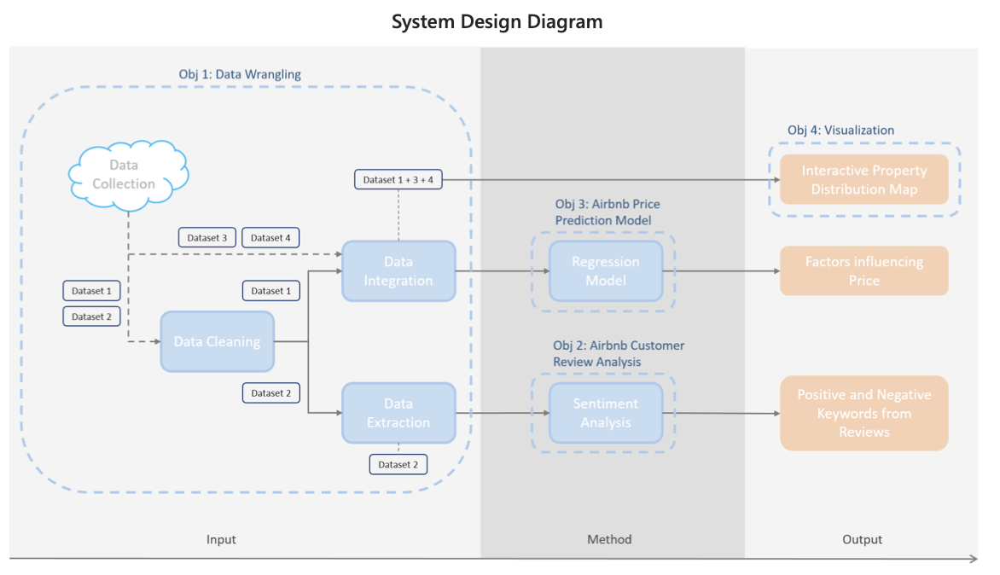

### Processing Modules and Algorithms

- __Data Wrangling__:  
  Removes NaNs and blanks, converts non-numeric to binary, preparing the dataset for analysis.
 
- __Data Integration__:
  Merges Datasets 1, 3, and 4, utilizing supplementary data to inform factors influencing property prices.
 
- __Data Extraction__:
  Filters Dataset 2 for English reviews from early 2023 for targeted sentiment analysis.
 
- __Sentiment Analysis__:
  Processes reviews to extract key positive and negative sentiments.
  
- __Regression Modeling__:
  Implements Linear Regression iteratively to pinpoint factors significantly affecting prices.
 
- __Visualization__:
  Creates word clouds and plots to visualize sentiment and pricing relationships; develops an interactive property distribution map.

# Program Code


## Import Libraries

In [122]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns
palette = 'bwr' 
sns.set_palette(palette)

import json

from collections import Counter
from datetime import datetime
import geopandas as gpd

import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.sandbox.regression.predstd import wls_prediction_std

import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from tqdm import tqdm
import logging
import langid
 
logging.disable(logging.CRITICAL)

from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm

from wordcloud import WordCloud
from gensim import corpora, models

#In order to avoid extra run  
import logging
logging.disable(logging.CRITICAL)

import warnings # close warining logs 
warnings.filterwarnings("ignore")

import folium
from folium.plugins import MarkerCluster
from folium import plugins

## Objective 1: Data Wrangling

### 1-1: Data Wrangling for Objective 3 and 4

#### 1-1-1: Read Dataset 1 and overview the data

In [2]:
df = pd.read_csv('dataset//listings.csv')

In [123]:
df.head(2)

,id,name,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,...,reviews_per_month,host_experience_days,host_response_time_numeric,room_type_Entire_homeapt,room_type_Hotel_room,room_type_Private_room,room_type_Shared_room,top_20_facility,Ave_Housing_borough_2017,Fare_Zone
0,92644,Rental unit in Earlsfield · ★4.57 · 1 bedroom ...,498201,2011-04-10,within an hour,93.454699,100.0,0,1.0,1.0,...,1.45,4532,1,0,0,1,0,0,818443.0,3
1,93015,Rental unit in Hammersmith · ★4.82 · 2 bedroom...,499704,2011-04-11,within a few hours,100.000000,25.0,0,1.0,2.0,...,0.27,4531,2,1,0,0,0,0,972231.0,2


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87946 entries, 0 to 87945
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            87946 non-null  int64  
 1   listing_url                                   87946 non-null  object 
 2   scrape_id                                     87946 non-null  int64  
 3   last_scraped                                  87946 non-null  object 
 4   source                                        87946 non-null  object 
 5   name                                          87946 non-null  object 
 6   description                                   86679 non-null  object 
 7   neighborhood_overview                         47190 non-null  object 
 8   picture_url                                   87943 non-null  object 
 9   host_id                                       87946 non-null 

In [4]:
column =['listing_url', 'last_scraped', 'scrape_id', 'description','source', 'neighborhood_overview',
         'picture_url', 'host_url', 'host_name','host_location', 'host_about', 'host_thumbnail_url',
         'host_picture_url', 'host_neighbourhood', 'host_verifications', 'host_identity_verified',
         'neighbourhood_group_cleansed', 'bathrooms', 'bathrooms_text', 'minimum_nights', 'maximum_nights',
         'minimum_minimum_nights', 'minimum_minimum_nights','maximum_minimum_nights', 'minimum_maximum_nights',
         'maximum_maximum_nights', 'calendar_updated', 'has_availability', 'calendar_last_scraped',
         'number_of_reviews', 'number_of_reviews_l30d',  'first_review', 'last_review', 'license', 'instant_bookable']

In [5]:
df.drop(column, axis = 1, inplace = True)

In [6]:
df.isnull().sum()

id                                                  0
name                                                0
host_id                                             0
host_since                                          5
host_response_time                              28918
host_response_rate                              28918
host_acceptance_rate                            25188
host_is_superhost                                 932
host_listings_count                                 5
host_total_listings_count                           5
host_has_profile_pic                                5
neighbourhood                                   40755
neighbourhood_cleansed                              0
latitude                                            0
longitude                                           0
property_type                                       0
room_type                                           0
accommodates                                        0
bedrooms                    

#### 1-1-2: Check for any duplicate rows in the data.

In [7]:
duplicates = df.duplicated()
print("Duplicate Rows except first occurrence:")
print(df[duplicates])

# Counting the number of duplicate rows
print("Number of duplicate rows:", duplicates.sum())

Duplicate Rows except first occurrence:
Empty DataFrame
Columns: [id, name, host_id, host_since, host_response_time, host_response_rate, host_acceptance_rate, host_is_superhost, host_listings_count, host_total_listings_count, host_has_profile_pic, neighbourhood, neighbourhood_cleansed, latitude, longitude, property_type, room_type, accommodates, bedrooms, beds, amenities, price, minimum_nights_avg_ntm, maximum_nights_avg_ntm, availability_30, availability_60, availability_90, availability_365, number_of_reviews_ltm, review_scores_rating, review_scores_accuracy, review_scores_cleanliness, review_scores_checkin, review_scores_communication, review_scores_location, review_scores_value, calculated_host_listings_count, calculated_host_listings_count_entire_homes, calculated_host_listings_count_private_rooms, calculated_host_listings_count_shared_rooms, reviews_per_month]
Index: []

[0 rows x 41 columns]
Number of duplicate rows: 0


#### 1-1-3: Deal with all blank and 'N/A' values in each column and map columns to convert string entries to numerical values. 

`host_since`  
Replace any blank or NaN entries with '2017-05-07', which is the most frequently occurring date in the `host_since` column.  
Add a column `host_experience_days`, which represents the number of days computed with `host_since` date and the date of 6th Sep 2023, when the Dataset 1 was obtained.

In [8]:
df['host_since'].value_counts()
df['host_since'].replace('', np.nan, inplace=True)
df['host_since'].fillna(value="2017-05-07", inplace=True)

In [9]:
df['host_since'] = pd.to_datetime(df['host_since'], format='%Y-%m-%d')
target_date = datetime.strptime("2023-09-06", "%Y-%m-%d")

df['host_experience_days'] = (target_date - df['host_since']).dt.days

`host_response_time`  
Replace any NaN entries with the most frequent value.  
Convert the descriptive entries to dummy values.

In [10]:
most_common_response = df['host_response_time'].mode()[0]
df['host_response_time'].fillna(most_common_response, inplace=True)
response_time_mapping = {'within an hour': 1, 'within a few hours': 2, 'within a day': 3,
                         'a few days or more': 4}
df['host_response_time_numeric'] = df['host_response_time'].map(response_time_mapping)

`host_response_rate`  
Convert the data type from string to float.  
Replace any NaN entries with the mean value. 

In [11]:
df['host_response_rate'] = df['host_response_rate'].str.replace('%', '').astype(float)
mean_response_rate = df['host_response_rate'].mean()
df['host_response_rate'].fillna(mean_response_rate, inplace=True)

`host_acceptance_rate`  
Convert the data type from string to float.  
Replace any NaN entries with the mean value. 

In [12]:
df['host_acceptance_rate'] = df['host_acceptance_rate'].str.replace('%', '').astype(float)
mean_response_rate = df['host_acceptance_rate'].mean()
df['host_acceptance_rate'].fillna(mean_response_rate, inplace=True)

`host_is_superhost`   
Replace any NaN entries with the value of one row above the row with NaN.  
Convert the string entries to dummy values.

In [13]:
df['host_is_superhost'].replace('', np.nan, inplace=True)
df['host_is_superhost'].fillna(method='ffill', inplace=True)
df['host_is_superhost'] = np.where(df['host_is_superhost'] == "t", 1, 0 )
df['host_is_superhost'].value_counts()

host_is_superhost
0    74504
1    13442
Name: count, dtype: int64

`host_listings_count`   
Replace any NaN entries with the mean value.

In [14]:
avg = df['host_listings_count'].mean()
df['host_listings_count'].replace(np.nan, avg, inplace=True)

`host_has_profile_pic`   
Replace any NaN entries with the value of one row above the row with NaN.  
Convert the string entries to dummy values.

In [15]:
df['host_has_profile_pic'] = df['host_has_profile_pic'].map({'t': 1, 'f': 0})
df['host_has_profile_pic'].fillna(method='ffill', inplace=True)

`room_type`     
Make separate columns for each room type and convert the string entries to dummy values.

In [16]:
df['room_type_Entire_homeapt'] = np.where(df['room_type'] == "Entire home/apt", 1, 0 )
df['room_type_Hotel_room'] = np.where(df['room_type'] == "Hotel room", 1, 0 )
df['room_type_Private_room'] = np.where(df['room_type'] == "Private room", 1, 0 )
df['room_type_Shared_room'] = np.where(df['room_type'] == "Shared room", 1, 0 )

`beds`   
Replace any NaN entries with the mean value.

In [17]:
avg = df['beds'].mean()
df['beds'].replace(np.nan, avg, inplace=True)

`host_total_listings_count`   
Replace any NaN entries with the mean value.

In [18]:
avg = df['host_total_listings_count'].mean()
df['host_total_listings_count'].replace(np.nan, avg, inplace=True)

`host_listings_count`   
Replace any NaN entries with the value of one row above the row with NaN.

In [19]:
df['host_listings_count'].replace('', np.nan, inplace=True)
df['host_listings_count'].fillna(method='ffill', inplace=True)

`host_total_listings_count`   
Replace any NaN entries with the value of one row above the row with NaN.

In [20]:
df['host_total_listings_count'].replace('', np.nan, inplace=True)
df['host_total_listings_count'].fillna(method='ffill', inplace=True)

`minimum_nights_avg_ntm`   
Replace any NaN entries with the value of one row above the row with NaN.

In [21]:
df['minimum_nights_avg_ntm'].replace('', np.nan, inplace=True)
df['minimum_nights_avg_ntm'].fillna(method='ffill', inplace=True)

`maximum_nights_avg_ntm`   
Replace any NaN entries with the value of one row above the row with NaN.

In [22]:
df['maximum_nights_avg_ntm'].replace('', np.nan, inplace=True)
df['maximum_nights_avg_ntm'].fillna(method='ffill', inplace=True)

`review_scores_rating`   
Remove the records with NaN entries in `review_scores_rating`  
as it is not practical to replace more than 22,000 NaN entries.

In [23]:
df.dropna(subset=['review_scores_rating'], inplace= True)

`reviews_per_month`   
Replace blank entries in with NaN and replace them with the mean value.  

In [24]:
df['reviews_per_month'].replace('', np.nan, inplace=True)
avg = df['reviews_per_month'].mean()
df['reviews_per_month'].replace(np.nan, avg, inplace=True)

`price`   
Convert string entries to float and then integers.

In [25]:
df['price'] = df['price'].astype(str)
df['price'] = df['price'].str.replace('$', '').str.replace(',', '').astype(float).astype(int)

`review_scores_accuracy`   
Replace NaN entries with the mean value.

In [26]:
avg = df['review_scores_accuracy'].mean()
df['review_scores_accuracy'].replace(np.nan, avg, inplace=True)

`review_scores_cleanliness`   
Replace NaN entries with the mean value.

In [27]:
avg = df['review_scores_cleanliness'].mean()
df['review_scores_cleanliness'].replace(np.nan, avg, inplace=True)

`review_scores_checkin`   
Replace NaN entries with the mean value.

In [28]:
avg = df['review_scores_checkin'].mean()
df['review_scores_checkin'].replace(np.nan, avg, inplace=True)

`review_scores_communication`   
Replace NaN entries with the mean value.

In [29]:
avg = df['review_scores_communication'].mean()
df['review_scores_communication'].replace(np.nan, avg, inplace=True)

`review_scores_location`   
Replace NaN entries with the mean value.

In [30]:
avg = df['review_scores_location'].mean()
df['review_scores_location'].replace(np.nan, avg, inplace=True)

`review_scores_value`   
Replace NaN entries with the mean value.

In [31]:
avg = df['review_scores_value'].mean()
df['review_scores_value'].replace(np.nan, avg, inplace=True)

#### 1-1-4: Identify the top 20 common amenities  
Add a column `top_20_facility` to identify properties equipped with all the top 20 common amenities

In [32]:
# Convert string-formatted lists of amenities into actual lists
def parse_amenities(amenities_str):
    try:
        # Convert the JSON string to a Python list
        return json.loads(amenities_str)
    except json.JSONDecodeError:
        # If parsing fails, return an empty list
        return []

# Apply the parsing function to each amenities string
amenities_lists = df['amenities'].apply(parse_amenities)

# Flatten the lists of amenities into a single list
all_amenities = [amenity for sublist in amenities_lists for amenity in sublist]

# Count the occurrences of each amenity
amenity_counts = Counter(all_amenities)

# Display the top 20 most common amenities and their counts
for amenity, count in amenity_counts.most_common(30):
    print(f"{amenity}: {count}")

Smoke alarm: 60536
Kitchen: 60125
Wifi: 59673
Essentials: 58313
Iron: 50506
Hangers: 50214
Hair dryer: 47798
Hot water: 46706
Carbon monoxide alarm: 45207
Washer: 45007
Heating: 44232
Dishes and silverware: 43245
Refrigerator: 40764
Cooking basics: 39575
Bed linens: 39165
Shampoo: 39112
Microwave: 34209
TV: 32999
Oven: 28801
Dedicated workspace: 27688
Hot water kettle: 27592
Long term stays allowed: 25031
Cleaning products: 24721
First aid kit: 24394
Fire extinguisher: 23405
Bathtub: 23065
Toaster: 22975
Self check-in: 22821
Freezer: 22661
Dishwasher: 22335


In [33]:
top_20_facility = ['Smoke alarm', 'Kitchen', 'Wifi', 'Essentials', 'Iron',
                   'Hangers', 'Hair dryer', 'Hot water', 'Carbon monoxide alarm',
                   'Washer','Heating','Dishes and silverware', 'Refrigerator', 
                   'Cooking basics', 'Bed linens', 'Shampoo','Microwave', 'TV',
                   'Oven', 'Dedicated workspace', 'Hot water kettle']

df['top_20_facility'] = df['amenities'].apply(lambda amenities: 1 
                                              if all(facility in amenities for facility in top_20_facility) else 0)

#### 1-1-5: Add Dataset 3, Average Housing Price by boroughs data to Dataset 1

`Ave_Housing_borough_2017`   
Add another dataset of the average housing prices by boroughs to the dataframe.  
Read the csv file and obtain necessary data from the file.  
Average housing price by boroughs are added to the dataframe with the area names as a key.

In [34]:
#Read Dataset 3
housing = pd.read_csv('dataset//land-registry-house-prices-borough.csv')
housing = housing[housing['Year']=='Year ending Dec 2017']
housing = housing[housing['Measure']=='Mean']
housing = housing[['Code', 'Area', 'Value']]
housing['Value'] = housing['Value'].str.replace(',', '')
housing['Value'] = housing['Value'].astype('float')

In [35]:
df = pd.merge(df, housing, left_on='neighbourhood_cleansed', right_on='Area' , how='left')
df.rename(columns={'Value': 'Ave_Housing_borough_2017'}, inplace=True)
df.drop(columns = ['Code', 'Area'], inplace=True)

#### 1-1-6: Add Dataset 4, London Fare Zone data to Dataset 1

In [36]:
# Read Dataset 4: (1) Polygons of Output Areas (OA_2011) and (2) Fare zone data
London_shp = gpd.read_file('dataset//OA_2011_London_gen_MHW.shp')
London_fare = gpd.read_file('dataset//MyLondon_fare_zone_OA.csv')
London_shp = London_shp[['OA11CD', 'geometry']]
London_shp = London_shp.to_crs(crs=4326)
# Merge the polygons with fare zone data
London_shp_fare = pd.merge(London_shp, London_fare, on ='OA11CD' , how='left')
London_shp_fare = London_shp_fare.drop(['geometry_y'],axis=1)
London_shp_fare = London_shp_fare.rename(columns={'geometry_x': 'geometry'})

# Add the fare zone information to Dataset 1 using the coordinates of properties.
df_loc = gpd.GeoDataFrame(df, 
                          geometry=gpd.points_from_xy(df['longitude'], df['latitude']), crs=4326)
df_loc = gpd.sjoin(df_loc, London_shp_fare, predicate='intersects')
df_loc_plot = df_loc.copy() #Make a copy of dataframe for visualisation
df_loc = df_loc[['id', 'Fare_Zone']]
 
df = pd.merge(df, df_loc, on ='id' , how='left')

# Drop 18 properties (rows) in Dataset 1 of which corresponding fare zone could not be identified.
# 18 propoerties are located outside polygons of Output Areas (e.g. river banks.),
# and they were exluced from our dataset. 
df.dropna(subset=['Fare_Zone'], inplace = True)
df['Fare_Zone'] = df['Fare_Zone'].astype('int')

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 65770 entries, 0 to 65787
Data columns (total 50 columns):
 #   Column                                        Non-Null Count  Dtype         
---  ------                                        --------------  -----         
 0   id                                            65770 non-null  int64         
 1   name                                          65770 non-null  object        
 2   host_id                                       65770 non-null  int64         
 3   host_since                                    65770 non-null  datetime64[ns]
 4   host_response_time                            65770 non-null  object        
 5   host_response_rate                            65770 non-null  float64       
 6   host_acceptance_rate                          65770 non-null  float64       
 7   host_is_superhost                             65770 non-null  int32         
 8   host_listings_count                           65770 non-null  float64  

### 1-2: Data Wrangling for Objective 2

#### 1-2-1: Read Dataset 2, Airbnb Customer reviews and shorten the data 

In [38]:
# Open the file which contain comments from the customer
df_review = pd.read_csv("dataset//reviews.csv")

In [39]:
# View the top rows
df_review.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,13913,80770,2010-08-18,177109,Michael,My girlfriend and I hadn't known Alina before ...
1,13913,367568,2011-07-11,19835707,Mathias,Alina was a really good host. The flat is clea...
2,13913,529579,2011-09-13,1110304,Kristin,Alina is an amazing host. She made me feel rig...
3,13913,595481,2011-10-03,1216358,Camilla,"Alina's place is so nice, the room is big and ..."
4,13913,612947,2011-10-09,490840,Jorik,"Nice location in Islington area, good for shor..."


In [40]:
num_rows, num_columns = df_review.shape

# Print the number of rows and column
print("Number of rows:", num_rows)
print("Number of columns:", num_columns)

Number of rows: 1581033
Number of columns: 6


It may require a lot of computing power to process the complete dataset because of the size of the DataFrame. In order to handle this, the data will be shortened according to dates to allow for more effective analysis and this will assist us in gaining significant insights.

In [41]:
# we choose first five months of data for our project
# shorten the dataframe by dates
df_review_date = df_review[(df_review['date']>='2023-01-08')&
                           (df_review['date'] <'2023-05-08')]
df_review_date.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
208,15400,865851285579806116,2023-04-09,21544911,Hana,"아주 깨끗합니다. 화장실, 주방, 침실이 청결에 아주 중요하다고 생각하는 사람인데,..."
209,15400,881714137032337737,2023-05-01,100840491,Tim,Another great time. This flat is perfect for m...
253,264780,836070655440871421,2023-02-27,265765890,Souleymane,Logement correct<br/>Belle piscine avec pas tr...
254,264780,865751972953712856,2023-04-09,267354237,Niels,Fin og rummelig lejlighed. 5-10 min gang til t...
255,264780,883959261183020598,2023-05-04,141110874,Leonie,"Heel fijn verblijf gehad met ons gezin, ruim h..."


In [42]:
#See the shortened data
rows, columns = df_review_date.shape

# Print the number of rows and column
print("Number of rows:", rows)
print("Number of columns:", columns)

Number of rows: 142251
Number of columns: 6


Previous dataset: Number of rows - 1581033, Number of columns - 6  
After filtering: Number of rows - 142251, Number of columns - 6  
This step is essential for analyzing data within the desired dataframe.

In [43]:
df_review_date['listing_id'].value_counts()

listing_id
47408549              256
30760930              208
51995470              163
51738677              145
44583982              114
                     ... 
759354521614758544      1
44224603                1
44345448                1
44349214                1
884088198174881317      1
Name: count, Length: 24770, dtype: int64

#### 1-2-2: Filtering English comment data

For simplification purposes in our project analysis, we will be focusing exclusively on English comments. Any non-English comments will not be included in the analysis to ensure consistency and accuracy. 

In [44]:
# classifying comments into languages using langid library 
df_review_date['lang'] = df_review_date['comments'].apply(lambda x:
                                                          langid.classify(str(x))[0])

In [45]:
# Filter rows where language is identified as English ('en')
df_review_date_en = df_review_date[df_review_date['lang'] == 'en']

In [46]:
df_review_date_en

,listing_id,id,date,reviewer_id,reviewer_name,comments,lang
209,15400,881714137032337737,2023-05-01,100840491,Tim,Another great time. This flat is perfect for m...,en
351,264783,834727901042264787,2023-02-25,418671295,Brad,Am amazing place ! <br/>Highly recommend!!,en
352,264783,840470131686478052,2023-03-05,5396248,Helen,Sue always responded quickly and dealt with pr...,en
353,264783,871639030362526407,2023-04-17,18136913,Sherry,We had a great stay in a garden apartment at S...,en
354,264783,877381110328741407,2023-04-25,484937976,Sandra,We had a fab stay..it was perfect for us as a ...,en
...,...,...,...,...,...,...,...
1553153,883470924014447576,886063163330771493,2023-05-07,3954160,Philippe,Maria’s place is a perfect place in London. <b...,en
1553188,883473511616640664,886143104215061458,2023-05-07,511570627,Riaz Najmul,Really easy to get along with aswell as helpfu...,en
1553205,883013859460484730,886127809072682153,2023-05-07,459484449,Alias,Ana was very accommodating with flexible times...,en
1553223,883541446849444212,886126239194977984,2023-05-07,413160783,Yordan,Was pleasure,en


In [47]:
# Drop the 'lang' column if you no longer need it
df_review_date_en = df_review_date_en.drop(columns=['lang'])

In [48]:
# drop the br word from comments as it indicate line break (<br>)
df_review_date_en['comments'] = df_review_date_en['comments'].replace({'<br/>': '', '<br>': ''}, regex=True) 

In [49]:
df_review_date_en.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
209,15400,881714137032337737,2023-05-01,100840491,Tim,Another great time. This flat is perfect for m...
351,264783,834727901042264787,2023-02-25,418671295,Brad,Am amazing place ! Highly recommend!!
352,264783,840470131686478052,2023-03-05,5396248,Helen,Sue always responded quickly and dealt with pr...
353,264783,871639030362526407,2023-04-17,18136913,Sherry,We had a great stay in a garden apartment at S...
354,264783,877381110328741407,2023-04-25,484937976,Sandra,We had a fab stay..it was perfect for us as a ...


In [50]:
n_rows, n_columns = df_review_date_en.shape

# Print the number of rows
print("Number of rows:", n_rows)
print("Number of columns:", n_columns)

Number of rows: 111178
Number of columns: 6


Previous dataset: Number of rows - 142251, Number of columns - 6  
After filtering: Number of rows - 111178, Number of columns - 6  

In [51]:
df_review_date_en.info()

<class 'pandas.core.frame.DataFrame'>
Index: 111178 entries, 209 to 1554198
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   listing_id     111178 non-null  int64 
 1   id             111178 non-null  int64 
 2   date           111178 non-null  object
 3   reviewer_id    111178 non-null  int64 
 4   reviewer_name  111178 non-null  object
 5   comments       111158 non-null  object
dtypes: int64(3), object(3)
memory usage: 5.9+ MB


<br>

## Objective 2: Airbnb Customer Review Analysis


### 2-1: Downloading Natural Language Toolkit (NLTK) library

The Natural Language Toolkit, or NLTK, is a robust Python package for manipulating textual data in human languages. NLTK offers user-friendly interfaces to more than 50 lexical resources and corpora, including WordNet. A key features including tokenization, stemming, tagging, parsing, and semantic reasoning.

In [52]:
nltk.download('averaged_perceptron_tagger') 
#library in Python to download the pre-trained model for part-of-speech tagging
nltk.download('punkt') #splits full texts into word lists
nltk.download('stopwords') #the standard list of stop words to be removed
nltk.download('vader_lexicon') #list of words and scores used for sentiment analysis
nltk.download('maxent_ne_chunker') #entity recognition (NER) tasks
nltk.download('words') #downloads a dataset of words

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\subar\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\subar\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\subar\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\subar\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\subar\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     C:\Users\subar\AppData\Roaming\nltk_data...
[nltk_data]   Package words is

True

### 2-2: Performing Sentiment Analysis

In [53]:
sia = SentimentIntensityAnalyzer()

In [54]:
res = {}
sia = SentimentIntensityAnalyzer()

stop_words = set(stopwords.words('english'))

for i, row in tqdm(df_review_date_en.iterrows(), total=len(df_review_date_en)):
    text = row['comments']
    myid = row['id']

    # Check if the 'comments' value is a string
    if isinstance(text, str):
        # Tokenize the text
        tokens = word_tokenize(text)

        # Remove stopwords
        filtered_tokens = [word.lower() for word in tokens 
                           if word.isalnum() and word.lower() not in stop_words]

        # Join the filtered tokens back into a string
        filtered_text = ' '.join(filtered_tokens)

        # Perform sentiment analysis
        res[myid] = sia.polarity_scores(filtered_text)

    elif isinstance(text, (float, np.float64)):
        # Handle float values (or NaN) by assigning a neutral sentiment
        res[myid] = {'compound': 0.0, 'neg': 0.0, 'neu': 1.0, 'pos': 0.0}
    else:
        # Handle other data types (if any)
        print(f"Unexpected data type in row {i + 1}: {type(text)}")

# Now 'res' should contain sentiment analysis results for each 'id' in the DataFrame

  0%|          | 0/111178 [00:00<?, ?it/s]

In [55]:
# creating new dataframe with sentiment score
sentiscore = pd.DataFrame(res).T
sentiscore = sentiscore.reset_index().rename(columns={'index': 'id'})
sentiscore = sentiscore.merge(df_review_date_en, how='left')

In [56]:
sentiscore.head()

,id,neg,neu,pos,compound,listing_id,date,reviewer_id,reviewer_name,comments
0,881714137032337737,0.000,0.359,0.641,0.8934,15400,2023-05-01,100840491,Tim,Another great time. This flat is perfect for m...
1,834727901042264787,0.000,0.233,0.767,0.7645,264783,2023-02-25,418671295,Brad,Am amazing place ! Highly recommend!!
2,840470131686478052,0.107,0.572,0.321,0.9348,264783,2023-03-05,5396248,Helen,Sue always responded quickly and dealt with pr...
3,871639030362526407,0.000,0.699,0.301,0.9764,264783,2023-04-17,18136913,Sherry,We had a great stay in a garden apartment at S...
4,877381110328741407,0.024,0.473,0.504,0.9855,264783,2023-04-25,484937976,Sandra,We had a fab stay..it was perfect for us as a ...


In [57]:
r, c = sentiscore.shape

# Print the number of rows and column
print("Number of rows:", r)
print("Number of columns:", c)

Number of rows: 111178
Number of columns: 10


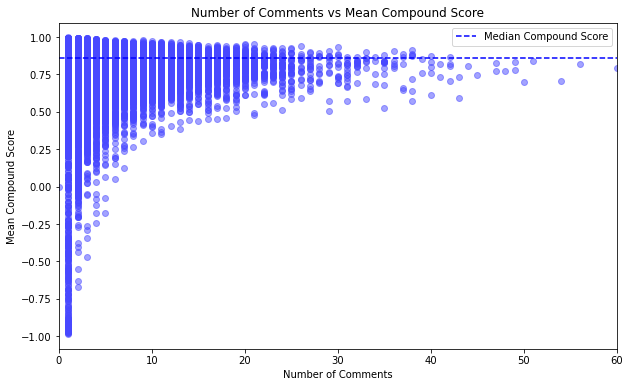

In [58]:
# Group by host id, calculate mean compound score and count number of comments
grouped_df = sentiscore.groupby('listing_id').agg({'compound': 'mean',
                                                   'comments': 'count'}).reset_index()
 
# Plotting
plt.figure(figsize=(10, 6))
plt.scatter(grouped_df['comments'], grouped_df['compound'], alpha=0.5)
plt.title('Number of Comments vs Mean Compound Score')
plt.xlabel('Number of Comments')
plt.ylabel('Mean Compound Score')
plt.xlim(0, 60)
 
# Add a median line
median_compound = grouped_df['compound'].median()
plt.axhline(y=median_compound, color='blue', linestyle='--', label='Median Compound Score')
 
plt.legend()  # Show legend with the median line
 
plt.show()

The correlation between the number of comments and the average compound score for Airbnb listings is represented visually by this scatter plot. The x-axis shows the number of comments received, and the y-axis shows the mean sentiment compound score derived from those comments. Each point on the plot represents a distinct listing_id.
 
This graphic makes it easy to evaluate how the sentiment of comments changes in relation to the amount of input received, providing insights into the general sentiment patterns of the properties that are shown. As we can see, ratings that are higher and have a higher compound score are positively correlated with more comments, whereas ratings that are lower and have a lower compound score often have less comments.

In [59]:
sentiscore.describe()

,id,neg,neu,pos,compound,listing_id,reviewer_id
count,1.111780e+05,111178.000000,111178.000000,111178.000000,111178.000000,1.111780e+05,1.111780e+05
mean,8.493031e+17,0.018142,0.469758,0.507756,0.801247,3.152704e+17,2.135558e+08
std,2.456920e+16,0.050328,0.179964,0.193848,0.257851,3.628594e+17,1.741368e+08
min,7.998204e+17,0.000000,0.000000,0.000000,-0.993300,1.540000e+04,2.870000e+02
25%,8.296543e+17,0.000000,0.350000,0.383000,0.763125,2.702801e+07,5.364094e+07
50%,8.513935e+17,0.000000,0.476000,0.508000,0.895700,5.159252e+07,1.651834e+08
75%,8.708422e+17,0.000000,0.589000,0.641000,0.954500,7.093749e+17,3.883398e+08
max,8.861753e+17,1.000000,1.000000,1.000000,0.998500,8.840882e+17,5.133717e+08


The value range for compound is from -1 to 1 where mean value is 0.8

<br>
Every property listing in our dataset has a unique ID, and each listing may have several reviews, each with a distinct ID and sentiment score. We use the following method to give a combined sentiment score for every indiviusal listing_id.

In [60]:
# Calculating mean value for compound score and merging listing_id

In [61]:
result_df = sentiscore.groupby('listing_id').agg({'compound': 'mean', 
                                                  'comments': lambda x: ', '.join(map(str, x))}).reset_index()

In [62]:
result_df.head()

,listing_id,compound,comments
0,15400,0.893400,Another great time. This flat is perfect for m...
1,36299,0.913867,Geert’s house was an easy choice for our famil...
2,36660,0.926767,Agri was so welcoming and kind— the lodge is v...
3,38995,0.843406,"Cesar was a helpful host, and helpfully flexib..."
4,41712,0.757900,"Nina is very friendly, the bed is comfortable,..."


In [63]:
result_df["comments"][65]

"Am amazing place ! Highly recommend!!, Sue always responded quickly and dealt with problems immediately. Comfortable apartment,  we didn't use the swimming pool because of lack of time,  maybe next time. Good public transport at a walking distance, as well as shops and supermarkets. Also, it's great to have a good parking place on premises. The place was quiet and peaceful with an outdoor sitting area and garden. Alas, we went during cold weather..I really recommend Sue's place. We were 7 adults and a toddler., We had a great stay in a garden apartment at Sue’s place all the amenities were as described. We were a family group with 8 and 5 year old children and a 93 year old great grandma! The pool and garden were a godsend allowing them to let off steam. The apartment was plenty big enough for dinner and movie nights in the evening when other family in the area often popped in. It was so useful to have housekeepers on site as answered questions and rectified a couple of minor plumbing

Total sentiment ratings calculated by averaging all compound score for all comments linked to a specific property ID. We are able to obtain a more complete and brief measure for analysis by using this method, which allows us to capture the overall sentiment showed in reviews for each id. For a more clear interpretation of the data, the combined sentiment score per property is a useful measure of the general sentiment attached to specific listings.

### 2-3: Calculating Rating for property based on sentiment score

We attempted to convert sentiment scores into property ratings, an index that is easier to understand, in our research. The goal is to provide a user-friendly representation of the overall sentiment for each property listing on a scale from 0 to 5.

In [64]:
# creating a function to calculate rating score from compound score
def compound_to_rating(compound_score):
    #compound_score ranges from -1 to 1
    scaled_score = (compound_score + 1) / 2  # Map [-1, 1] to [0, 1]
    rating = scaled_score * 5  # Scale to the range [0, 5]
    return round(rating, 1)  # Round to one decimal point

In [65]:
result_df['rating_score'] = result_df['compound'].apply(compound_to_rating)

In [66]:
result_df

,listing_id,compound,comments,rating_score
0,15400,0.893400,Another great time. This flat is perfect for m...,4.7
1,36299,0.913867,Geert’s house was an easy choice for our famil...,4.8
2,36660,0.926767,Agri was so welcoming and kind— the lodge is v...,4.8
3,38995,0.843406,"Cesar was a helpful host, and helpfully flexib...",4.6
4,41712,0.757900,"Nina is very friendly, the bed is comfortable,...",4.4
...,...,...,...,...
23608,883067150305759264,0.965100,"Extremely friendly and welcoming host, the pla...",4.9
23609,883470924014447576,0.989100,Maria’s place is a perfect place in London. It...,5.0
23610,883473511616640664,0.826800,Really easy to get along with aswell as helpfu...,4.6
23611,883541446849444212,0.571900,Was pleasure,3.9


In [67]:
result_df.describe()

,listing_id,compound,rating_score
count,2.361300e+04,23613.000000,23613.000000
mean,3.499214e+17,0.802983,4.507945
std,3.731267e+17,0.205036,0.512966
min,1.540000e+04,-0.985500,0.000000
25%,2.908931e+07,0.752533,4.400000
50%,5.330121e+07,0.858314,4.600000
75%,7.390256e+17,0.927300,4.800000
max,8.840882e+17,0.997700,5.000000


Plot the graph rating vs compounding score

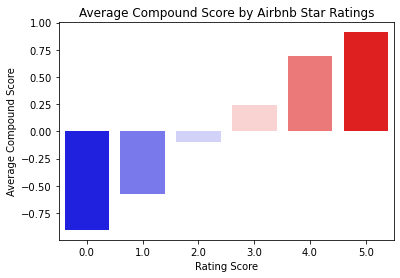

In [70]:
# Round the rating to the nearest integer
result_df['rounded_rating'] = result_df['rating_score'].round(0)

# Group by the rounded rating and calculate the mean compound score for each rating
grouped_data = result_df.groupby('rounded_rating')['compound'].mean().reset_index()

# Plot the bar graph

ax = sns.barplot(data=grouped_data, x='rounded_rating', y='compound', 
                 hue='rounded_rating', palette=palette, legend=False)
ax.set_title('Average Compound Score by Airbnb Star Ratings')
ax.set_xlabel('Rating Score')
ax.set_ylabel('Average Compound Score')
plt.show()

We found a clear correlation between sentiment scores and Airbnb ratings in our visualization. Reviews that have negative compound scores are more common in the lower rating range (0 to 2), whereas reviews with positive compound scores are associated with higher ratings (3 to 5). The correlation is consistent with user behaviour, as people are inclined to share their opinions in a review that reflects how satisfied or unsatisfied they are with the Airbnb stay in general. This information may be used by property managers or owners to comprehend the attitude regarding various rating categories.

In [71]:
result_df.head(2)

,listing_id,compound,comments,rating_score,rounded_rating
0,15400,0.893400,Another great time. This flat is perfect for m...,4.7,5.0
1,36299,0.913867,Geert’s house was an easy choice for our famil...,4.8,5.0


In [72]:
# We remove the rounded_rating column as it is just for display purposes.
result_df = result_df.drop(columns=['rounded_rating'])

In [73]:
result_df.head(2)

,listing_id,compound,comments,rating_score
0,15400,0.893400,Another great time. This flat is perfect for m...,4.7
1,36299,0.913867,Geert’s house was an easy choice for our famil...,4.8


In [74]:
# Identify highly positive and highly negative properties based on their mean compound scores
highly_positive_properties = result_df.nlargest(5, 'rating_score')
highly_negative_properties = result_df.nsmallest(5, 'rating_score')

In [75]:
print("Top 5 Highly Positive Properties:")
print(highly_positive_properties)

Top 5 Highly Positive Properties:
    listing_id  compound                                           comments  \
14       73125    0.9951  AMAZING! Seriously Anna is one the best Airbnb...   
17       78892    0.9936  How to describe my stay with Julia? Perfect, t...   
30       93783    0.9940  I highly recommend this uniquely atmospheric &...   
42      168348    0.9874  The flat was immaculate and very well appointe...   
50      214755    0.9893  James's wonderful flat was a perfect base for ...   

    rating_score  
14           5.0  
17           5.0  
30           5.0  
42           5.0  
50           5.0  


In [76]:
print("\nTop 5 Highly Negative Properties:")
print(highly_negative_properties)


Top 5 Highly Negative Properties:
               listing_id  compound  \
3018             15911617   -0.9855   
203                508343   -0.9783   
9429             45501488   -0.9443   
12198            53951561   -0.9779   
15259  670239892786841225   -0.9412   

                                                comments  rating_score  
3018   Worse apartment have ever stayed since I start...           0.0  
203    horrible! I think I should warn other people a...           0.1  
9429   i would 100% never recommend staying here.. i ...           0.1  
12198  Worst Airbnb host I’ve encountered! Host knew ...           0.1  
15259  The house is OK, but we had problems with the ...           0.1  


### 2-4: Extracting Common Positive and Negative Keywords

In [77]:
# filter positive and negative comments
positive_comments = result_df[result_df['rating_score'] >= 3.5]['comments']
negative_comments = result_df[result_df['rating_score'] < 2]['comments']

# Tokenize and join positive comments
positive_text = ' '.join([str(comment) for comment in positive_comments])
# Tokenize and join negative comments
negative_text = ' '.join([str(comment) for comment in negative_comments])

# Define a function to extract keywords
def extract_keywords(text, num_keywords=10):
    tokens = word_tokenize(text.lower())
    stop_words = set(stopwords.words('english'))
    filtered_tokens = [word for word in tokens 
                       if word.isalnum() and word not in stop_words]
    keyword_counter = Counter(filtered_tokens)
    return keyword_counter.most_common(num_keywords)

# Extract positive and negative keywords
positive_keywords = extract_keywords(positive_text)
negative_keywords = extract_keywords(negative_text)

In [78]:
print("Common Positive Keywords:")
print(positive_keywords)

Common Positive Keywords:
[('stay', 54432), ('great', 53839), ('place', 46433), ('location', 33267), ('clean', 28552), ('host', 28456), ('london', 25478), ('would', 24919), ('nice', 22779), ('room', 20620)]


In [79]:
print("\nCommon Negative Keywords:")
print(negative_keywords)


Common Negative Keywords:
[('host', 98), ('stay', 80), ('place', 75), ('room', 70), ('dirty', 56), ('shower', 56), ('water', 54), ('bathroom', 53), ('airbnb', 51), ('us', 50)]


### 2-5: Extracting Top Positive and Negative Keywords and checking its frequency

In [80]:
def extract_key(text):
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    keywords = [token.lower() for token in tokens 
                if token.isalpha() and token.lower() not in stop_words]
    return keywords

In [81]:
# filter positive and negative comments
positive_key = result_df[result_df['rating_score'] >= 4.5]['comments']
negative_key = result_df[result_df['rating_score'] <= 2]['comments']

In [82]:
# creating a empty list
positive_keywords_list = []
negative_keywords_list = []

In [83]:
# Extracting positive keywords
for comment in tqdm(positive_key):
    keywords = extract_key(comment)
    positive_keywords_list.append({'comments': comment, 'keywords': keywords})

  0%|          | 0/16437 [00:00<?, ?it/s]

In [84]:
# Extracting negative keywords
for comment in tqdm(negative_key):
    keywords = extract_key(comment)
    negative_keywords_list.append({'comments': comment, 'keywords': keywords})

  0%|          | 0/169 [00:00<?, ?it/s]

In [85]:
# printing positive keywords
positive_keywords_df = pd.DataFrame(positive_keywords_list)
positive_keywords_df.head()

,comments,keywords
0,Another great time. This flat is perfect for m...,"[another, great, time, flat, perfect, hope, ba..."
1,Geert’s house was an easy choice for our famil...,"[geert, house, easy, choice, family, stay, clo..."
2,Agri was so welcoming and kind— the lodge is v...,"[agri, welcoming, lodge, close, lot, great, re..."
3,"Cesar was a helpful host, and helpfully flexib...","[cesar, helpful, host, helpfully, flexible, pl..."
4,We LOVED staying at the Lodge with Agri and Ro...,"[loved, staying, lodge, agri, roger, arrived, ..."


In [86]:
# printing negative keywords
negative_keywords_df = pd.DataFrame(negative_keywords_list)
negative_keywords_df.head()

,comments,keywords
0,horrible! I think I should warn other people a...,"[horrible, think, warn, people, place, complet..."
1,Extensive water leak damage with large part of...,"[extensive, water, leak, damage, large, part, ..."
2,This was the worst airbnb experience I’ve ever...,"[worst, airbnb, experience, ever, place, airbn..."
3,"Unfortunately, I cannot recommend this accommo...","[unfortunately, recommend, accommodation, stay..."
4,This was by far the worst experience I have ev...,"[far, worst, experience, ever, host, stay, pla..."


In [87]:
# Flatten the list of keywords
flat_keywords_p = [keyword for sublist 
                   in positive_keywords_df['keywords'] for keyword in sublist]
flat_keywords_n = [keyword for sublist 
                   in negative_keywords_df['keywords'] for keyword in sublist]

# Use Counter to get the frequency of each keyword
keyword_freq_p = Counter(flat_keywords_p)
keyword_freq_n = Counter(flat_keywords_n)


# Convert the Counter to a DataFrame for easy analysis and visualization
keyword_freq_df_p = pd.DataFrame(list(keyword_freq_p.items()), 
                                 columns=['Keyword', 'Frequency'])
keyword_freq_df_n = pd.DataFrame(list(keyword_freq_n.items()), 
                                 columns=['Keyword', 'Frequency'])

# Sort the DataFrame by frequency in descending order
keyword_freq_df_p = keyword_freq_df_p.sort_values(by='Frequency', ascending=False)
keyword_freq_df_n = keyword_freq_df_n.sort_values(by='Frequency', ascending=False)

In [88]:
# Display the resulting DataFrame for positive keyword
keyword_freq_df_p.head(10)

,Keyword,Frequency
14,stay,40252
1,great,40020
29,place,33196
73,location,23394
108,host,21220
90,clean,20273
20,london,19576
95,would,18610
180,nice,15767
135,apartment,14430


Positive sentiment is quite dominant in the dataset, as indicated by the frequency analysis of positive keywords. Reviews with terms like "great," "clean," "nice," and "location" tend to be more positive.

In [89]:
# Display the resulting DataFrame for negative keyword
keyword_freq_df_n.head(10)

,Keyword,Frequency
172,host,99
141,stay,82
4,place,78
44,room,77
29,dirty,62
34,shower,57
41,water,56
181,us,54
31,bathroom,54
158,airbnb,53


Terms like "dirty," "shower," and "water" indicate instances of unfavourable opinion about amenities and hygiene.

### 2-6: Wordcloud for positive and negative keywords

In [90]:
# filter out postive and negative comments
positive_comments = result_df[result_df['rating_score'] >= 4.5]['comments']
negative_comments = result_df[result_df['rating_score'] < 2]['comments']

# Tokenize and join positive comments
positive_text = ' '.join([str(comment) for comment in positive_comments])
# Tokenize and join negative comments
negative_text = ' '.join([str(comment) for comment in negative_comments])

# Define a function to create a word cloud
def create_wordcloud(text, title):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

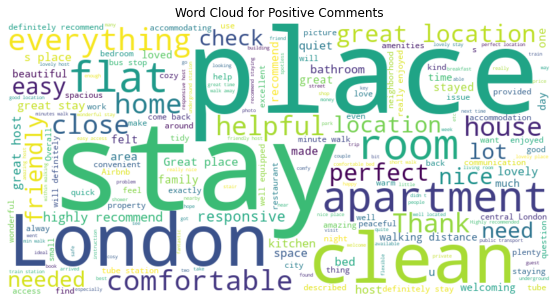

In [91]:
# Create word clouds for positive and negative comments
create_wordcloud(positive_text, 'Word Cloud for Positive Comments')

Positive Wordcloud: The dataset conveys predominantly optimistic attitudes, which are clearly captured in our positive keyword word cloud. The cloud has keywords like "Helpful," "clean," "nice," and "Place," indicating that happy experiences are generally connected with it. The terms "location" and "apartment" are also used to emphasise the favourable reviews regarding the residences' setting and quality.

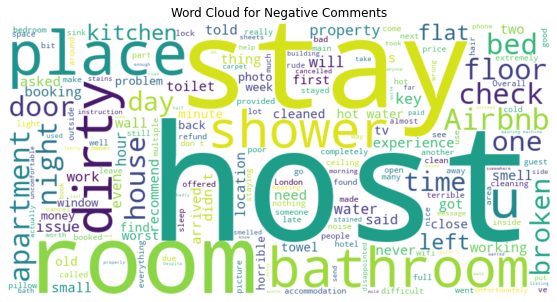

In [92]:
create_wordcloud(negative_text, 'Word Cloud for Negative Comments')

Negative wordcloud: The negative term word cloud captures important information about the dataset's areas of unhappiness. Among the striking aspects are terms such as "toilet," "shower," and "dirty," which highlight particular problems with facilities and cleanliness. Negative keywords that include "host" indicate possible problems in the host-guest experience, whereas "room" and "bathroom" highlight particular areas where visitors could have had problems with amenities.

In [93]:
positive_keywords_df['tokens'] = positive_keywords_df['comments'].apply(extract_key)

# Create a dictionary and corpus for LDA
dictionary = corpora.Dictionary(positive_keywords_df['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in positive_keywords_df['tokens']]

# Train the LDA model
lda_model = models.LdaModel(corpus, num_topics=5, id2word=dictionary, passes=15)

# Explore topics and associated keywords
topics = lda_model.print_topics(num_words=5)
for topic in topics:
    print(topic)

(0, '0.042*"great" + 0.038*"stay" + 0.029*"place" + 0.022*"location" + 0.020*"host"')
(1, '0.030*"stay" + 0.030*"room" + 0.028*"place" + 0.024*"great" + 0.022*"clean"')
(2, '0.017*"great" + 0.016*"location" + 0.011*"apartment" + 0.011*"place" + 0.011*"stay"')
(3, '0.026*"home" + 0.017*"stay" + 0.015*"us" + 0.014*"lovely" + 0.013*"house"')
(4, '0.015*"lovely" + 0.015*"house" + 0.015*"sam" + 0.015*"sarah" + 0.014*"park"')


Topic 0 and 4 emphasise feelings that are overwhelmingly comfortable. In Topic 0, visitors highlight the room's quality and cleanliness while expressing gratitude for their overall pleasant experience. Topic 4 emphasises the good comments and highlights the host's warmth and the cosy ambiance of the lodging.
Topic 1 and 2 concentrate on the location of the lodging and the whole experience. Good memories of the visit, the apartment's unique qualities, and its handy location all add to the pleasant story.

In [94]:
negative_keywords_df['tokens'] = negative_keywords_df['comments'].apply(extract_key)

# Create a dictionary and corpus for LDA
dictionary = corpora.Dictionary(negative_keywords_df['tokens'])
corpus = [dictionary.doc2bow(tokens) for tokens in negative_keywords_df['tokens']]

# Train the LDA model
lda_model = models.LdaModel(corpus, num_topics=5, id2word=dictionary, passes=15)

# Explore topics and associated keywords
topics = lda_model.print_topics(num_words=5)
for topic in topics:
    print(topic)

(0, '0.013*"stay" + 0.012*"room" + 0.009*"shower" + 0.009*"would" + 0.009*"dirty"')
(1, '0.010*"place" + 0.009*"bathroom" + 0.009*"host" + 0.008*"stay" + 0.008*"room"')
(2, '0.012*"apartment" + 0.008*"stay" + 0.008*"host" + 0.006*"get" + 0.005*"house"')
(3, '0.016*"host" + 0.009*"us" + 0.009*"place" + 0.008*"water" + 0.007*"airbnb"')
(4, '0.008*"bed" + 0.007*"flat" + 0.007*"host" + 0.007*"kitchen" + 0.007*"water"')


Topic 0 and 3 seem to centre on the lodging itself, covering things like the kind of "flat" and details on the bathroom and bedroom. Topic 0 also includes hints about possible enhancements ("could") or ideas from visitors.
Topic 4, hygiene issues, particular references to a "dirty" kitchen suggest that cleanliness has a big impact on how guests feel about their stay and how they perceive the host and the lodging.

<br> 

## Objective 3: Airbnb Price Prediction Model

Objective 3 aims to develop a multiple linear regression model to identify influential variables on Airbnb prices and to predict a suitable price for given property attributes.  The following chunks describe the model which outputs predicted price based on the property attributes.

### 3-1: Developing First Prediction Model

We developed the first regression model with all the available variables to examine the each variable's influence.

In [95]:
#Set a dependent variable and independent variables.
y1 = df['price']
X1 = df[['host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 
         'host_listings_count', 'host_total_listings_count', 'host_has_profile_pic',
         'latitude', 'longitude','accommodates', 'beds', 'minimum_nights_avg_ntm', 
         'maximum_nights_avg_ntm','availability_30', 'availability_60', 'availability_90',
         'availability_365','number_of_reviews_ltm', 'review_scores_rating',
         'review_scores_accuracy','review_scores_cleanliness', 'review_scores_checkin', 
         'review_scores_communication', 'review_scores_location', 'review_scores_value',
         'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes',
         'calculated_host_listings_count_private_rooms', 'calculated_host_listings_count_shared_rooms',
         'reviews_per_month', 'host_response_time_numeric', 'host_experience_days','room_type_Entire_homeapt',
         'room_type_Hotel_room', 'room_type_Private_room', 'room_type_Shared_room', 'Ave_Housing_borough_2017',
         'top_20_facility', 'Fare_Zone']]

In [96]:
#Develop a multiple regression model (first model).
x1 = sm.add_constant(X1)
mod1 = sm.OLS(y1, x1)
results1 = mod1.fit()
print(results1.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.071
Model:                            OLS   Adj. R-squared:                  0.070
Method:                 Least Squares   F-statistic:                     135.8
Date:                Sun, 03 Dec 2023   Prob (F-statistic):               0.00
Time:                        20:54:43   Log-Likelihood:            -4.9571e+05
No. Observations:               65770   AIC:                         9.915e+05
Df Residuals:                   65732   BIC:                         9.918e+05
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
                                                   coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------

The adjusted R-squared value is extremely low, so this model needs significant improvements.  
Also, the p values of some variables (greater than 0.05) indicate that they are not statistically significant and should be excluded from the model.  

As a next step, we compute the absolute value for the product of the mean and coefficient of every variable to examine the influence of each variable against the dependent variable (price).

In [97]:
data = {
    'variable': [
        'host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 
        'host_listings_count', 'host_total_listings_count', 'host_has_profile_pic', 
        'latitude', 'longitude', 'accommodates', 'beds', 'minimum_nights_avg_ntm', 
        'maximum_nights_avg_ntm', 'availability_30', 'availability_60', 
        'availability_90', 'availability_365', 'number_of_reviews_ltm', 
        'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 
        'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 
        'review_scores_value', 'calculated_host_listings_count', 
        'calculated_host_listings_count_entire_homes', 
        'calculated_host_listings_count_private_rooms', 
        'calculated_host_listings_count_shared_rooms', 'reviews_per_month', 
        'host_response_time_numeric', 'host_experience_days', 'room_type_Entire_homeapt', 
        'room_type_Hotel_room', 'room_type_Private_room', 'room_type_Shared_room', 
        'Ave_Housing_borough_2017', 'top_20_facility'
    ],
    'coef': [
        -0.0321, -0.1102, 0.0001, 0.8722, -0.2907, 10.8565, 52.0428, 97.8666,
        31.4793, 10.0405, 0.0899, 9.097e-08, 0.5612, 1.3203, -0.1587, 0.0397,
        -0.1816, 1.5682, 9.3516, 21.8012, -9.1644, -10.8928, 34.9454, -17.6349,
        -3.3192, 3.4832, 4.1910, -6.1965, -8.6134, 0.1862, -0.0005, -570.0996,
        -530.9289, -596.5468, -596.7284, 8.658e-05, 14.8307
    ]
}


coefficients = pd.DataFrame(data)
mean_values = [df[i].mean() for i in coefficients['variable']]

coefficients['mean_value'] = mean_values

# Compute the absolute value of mean * coef
coefficients['mean_coef'] = coefficients['coef'] * coefficients['mean_value']
coefficients['abs_mean_coef'] = coefficients['mean_coef'].abs()

# Sort in the decending order
sorted_abs_coefficients = coefficients.sort_values('abs_mean_coef', ascending=False)
sorted_abs_coefficients[['variable', 'coef', 'mean_value', 'mean_coef', 'abs_mean_coef']]

,variable,coef,mean_value,mean_coef,abs_mean_coef
6,latitude,5.204280e+01,51.509289,2680.687630,2680.687630
31,room_type_Entire_homeapt,-5.700996e+02,0.631747,-360.158710,360.158710
33,room_type_Private_room,-5.965468e+02,0.361654,-215.743685,215.743685
22,review_scores_location,3.494540e+01,4.720482,164.959126,164.959126
19,review_scores_cleanliness,2.180120e+01,4.623328,100.794090,100.794090
8,accommodates,3.147930e+01,3.178668,100.062246,100.062246
23,review_scores_value,-1.763490e+01,4.593389,-81.003956,81.003956
35,Ave_Housing_borough_2017,8.658000e-05,870044.452623,75.328449,75.328449
21,review_scores_communication,-1.089280e+01,4.798883,-52.273270,52.273270
24,calculated_host_listings_count,-3.319200e+00,13.462156,-44.683588,44.683588


In addition,we compute the Variance Inflation Factor (VIF) to examine the multicollinearity between independent variables.

In [98]:
#Calculate VIF
X1 = sm.add_constant(X1)

vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X1.values, i) for i in range(X1.shape[1])]
vif["features"] = X1.columns
vif

,VIF Factor,features
0,inf,const
1,1.560217,host_response_rate
2,1.434168,host_acceptance_rate
3,1.187371,host_is_superhost
4,31.254480,host_listings_count
5,22.908771,host_total_listings_count
6,1.062082,host_has_profile_pic
7,1.025593,latitude
8,1.236202,longitude
9,4.002111,accommodates


### 3-2: Developing Second Prediction Model

Based on the outcome of the first model, we developed the second model with limited variables.
In this model, the variables which apply to the following conditions were excluded.
- p value is greater than 0.05.
- VIF is greater than 10.
- The absolute value for the product of the mean and coefficient is low.

In [99]:
##Set a dependent variable and independent variables.
y2 = df['price']
X2 = df[['room_type_Entire_homeapt', 'review_scores_location', 'review_scores_value', 
         'accommodates', 'review_scores_cleanliness', 'Ave_Housing_borough_2017', 
         'review_scores_communication','review_scores_checkin', 'calculated_host_listings_count',
         'review_scores_checkin','beds', 'host_acceptance_rate', 'reviews_per_month' ,
         'review_scores_rating', 'host_is_superhost']]

In [100]:
#Develop a multiple regression model (second model).
x2 = sm.add_constant(X2)
mod2 = sm.OLS(y2, x2)
results2 = mod2.fit()
print(results2.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.058
Model:                            OLS   Adj. R-squared:                  0.058
Method:                 Least Squares   F-statistic:                     290.6
Date:                Sun, 03 Dec 2023   Prob (F-statistic):               0.00
Time:                        20:54:51   Log-Likelihood:            -4.9616e+05
No. Observations:               65770   AIC:                         9.924e+05
Df Residuals:                   65755   BIC:                         9.925e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

The model precision is still extremely low, so narrow the prediction price range, removing outliers.

### 3-3: Developing Final Prediction Model

One of potential causes of the low precision with previous models is that there are outliers in the dependent variable. Here, we observe the distribution of `price`.

In [101]:
#Check the price distribution. 
df['price'].describe()

count    65770.000000
mean       161.957473
std        471.053208
min          0.000000
25%         63.000000
50%        108.000000
75%        182.000000
max      80100.000000
Name: price, dtype: float64

It is obvious that outliers present and skew the price data.  
Using the records with a price of GBP 200 or less is reasonable as more than 75% of records fall into the range.

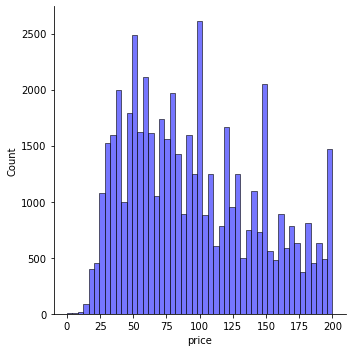

In [102]:
#Filter records with a price of GBP 200 or less 
df_pricebelow = df[df['price']<=200]
sns.displot(df_pricebelow['price'])

In [121]:
#See the dataframe after filtering
df_pricebelow.head(2)

,id,name,host_id,host_since,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,...,reviews_per_month,host_experience_days,host_response_time_numeric,room_type_Entire_homeapt,room_type_Hotel_room,room_type_Private_room,room_type_Shared_room,top_20_facility,Ave_Housing_borough_2017,Fare_Zone
0,92644,Rental unit in Earlsfield · ★4.57 · 1 bedroom ...,498201,2011-04-10,within an hour,93.454699,100.0,0,1.0,1.0,...,1.45,4532,1,0,0,1,0,0,818443.0,3
1,93015,Rental unit in Hammersmith · ★4.82 · 2 bedroom...,499704,2011-04-11,within a few hours,100.000000,25.0,0,1.0,2.0,...,0.27,4531,2,1,0,0,0,0,972231.0,2


We present the heatmap of correlation matrix, which represents the correlation coefficient between variables in the model.
The value is close to 1.0 or -1.0 is considered to posses a strong relationship among the corresponding variables.

<AxesSubplot:>

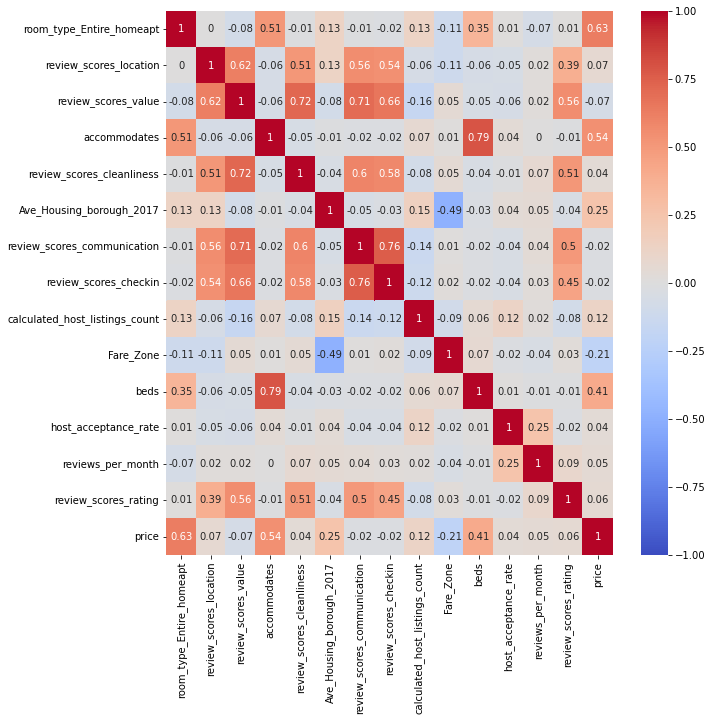

In [104]:
# Heatmap of Correlation Matrix
variables = [
    'room_type_Entire_homeapt', 'review_scores_location', 'review_scores_value', 
    'accommodates', 'review_scores_cleanliness', 'Ave_Housing_borough_2017', 
    'review_scores_communication', 'review_scores_checkin', 'calculated_host_listings_count', 
    'Fare_Zone', 'beds', 'host_acceptance_rate', 'reviews_per_month', 'review_scores_rating'
]

correlation_matrix = round(df_pricebelow[variables + ['price']].corr(),2)
fig = plt.figure(figsize=(10,10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1.0, vmax=1.0)

Finally, we develop a regression model with the filtered data and the limited independent variables. 

In [105]:
##Set a dependent variable and independent variables.
y3 = df_pricebelow['price']
X3 = df_pricebelow[['room_type_Entire_homeapt', 'review_scores_location', 
                    'review_scores_value','accommodates', 'review_scores_cleanliness',
                    'Ave_Housing_borough_2017', 'review_scores_communication',
                    'review_scores_checkin', 'calculated_host_listings_count', 
                    'review_scores_checkin', 'Fare_Zone','beds', 'host_acceptance_rate',
                    'reviews_per_month' , 'review_scores_rating']]

In [106]:
#Develop a multiple regression model (final model).
x3 = sm.add_constant(X3)
mod3 = sm.OLS(y3, x3)
results3 = mod3.fit()
print(results3.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.531
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     4242.
Date:                Sun, 03 Dec 2023   Prob (F-statistic):               0.00
Time:                        20:54:54   Log-Likelihood:            -2.5870e+05
No. Observations:               52506   AIC:                         5.174e+05
Df Residuals:                   52491   BIC:                         5.176e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const       

The model precision (the adjusted R-squared value) improved to 0.531, and all the independent variables are statistically significant, as shown in their p-values.
This is the final regression model with the best precision obtained after developing several models. 

To identify the influential variables in the same scale regardless of the variable sizes, we compute again the absolute value for the product of the mean and coefficient of every variable.

In [107]:
data = {
    'variable': [
        'room_type_Entire_homeapt', 'review_scores_location', 'review_scores_value', 
        'accommodates', 'review_scores_cleanliness', 'Ave_Housing_borough_2017', 
        'review_scores_communication', 'review_scores_checkin', 
        'calculated_host_listings_count', 'Fare_Zone', 'beds', 
        'host_acceptance_rate', 'reviews_per_month', 'review_scores_rating'
    ],
    'coef': [
        43.2891, 10.8154, -13.9476, 9.0021, 11.8974, 1.4e-05, 
        -5.1650, -1.6097, 0.0109, -3.9359, 2.6917, -0.0164, 
        2.0335, 4.6901
    ]
}

coefficients = pd.DataFrame(data)
mean_values = [df[i].mean() for i in coefficients['variable']]

coefficients['mean_value'] = mean_values
coefficients['mean_coef'] = coefficients['coef'] * coefficients['mean_value']
coefficients['abs_mean_coef'] = coefficients['mean_coef'].abs()

sorted_abs_coefficients = coefficients.sort_values('abs_mean_coef', ascending=False)
sorted_abs_coefficients[['variable', 'coef', 'mean_value',
                         'mean_coef', 'abs_mean_coef']]

,variable,coef,mean_value,mean_coef,abs_mean_coef
2,review_scores_value,-13.947600,4.593389,-64.066753,64.066753
4,review_scores_cleanliness,11.897400,4.623328,55.005578,55.005578
1,review_scores_location,10.815400,4.720482,51.053899,51.053899
3,accommodates,9.002100,3.178668,28.614688,28.614688
0,room_type_Entire_homeapt,43.289100,0.631747,27.347759,27.347759
6,review_scores_communication,-5.165000,4.798883,-24.786230,24.786230
13,review_scores_rating,4.690100,4.596511,21.558098,21.558098
5,Ave_Housing_borough_2017,0.000014,870044.452623,12.180622,12.180622
9,Fare_Zone,-3.935900,2.357062,-9.277162,9.277162
7,review_scores_checkin,-1.609700,4.777325,-7.690060,7.690060


According to the result, the most influential variable is `review_scores_value` followed by `review_scores_cleanliness` and `review_scores_location`. Furthermore, `acommodates` (the number of persons that can stay) and `room_type_Entire_homeapt` (whether the property provides an entire private apartment) have a relatively significant influence on prices. This implies that more spacious and private properties are more likely to set a higher price at Airbnb.

To wrap up the model result, we investigate the correlations between the final model's independent variables and the dependent variable `price` in scatter plots.

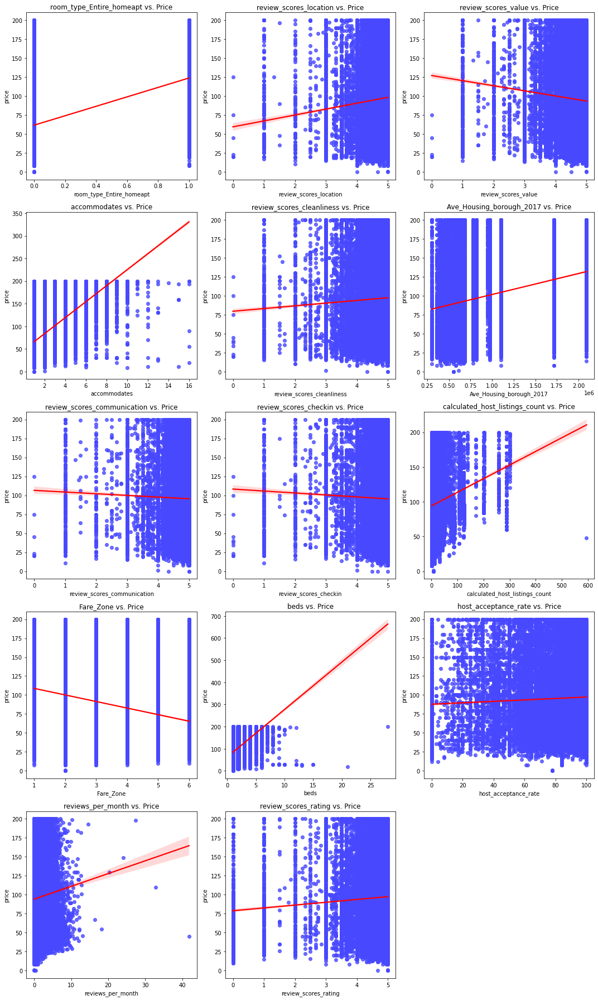

In [108]:
# Plot correlations of every variable and the independent variable, including the regression lines.

nrows = len(variables) // 3 + (1 if len(variables) % 3 else 0)

fig, axes = plt.subplots(nrows=nrows, ncols=3, figsize=(15, nrows * 5))

axes = axes.flatten()

# Loop through the variables and create a regplot for each
for i, var in enumerate(variables):
    sns.regplot(x=var, y='price', data=df_pricebelow, ax=axes[i], line_kws={'color': 'red'})
    axes[i].set_title(f'{var} vs. Price')

# Hide any empty subplot areas
for i in range(len(variables), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

The individual scatter plots with the regression lines give us insights into the relationship between each variable and the price.

- `room_type_Entire_homeapt`:  
  This plot likely represents a binary categorical variable where a value of 1 indicates an entire home/apartment and 0 otherwise. The positive relationship indicates that entire homes/apartments tend to have higher prices.  

- `review_scores_location`:    
  Higher location review scores seem to correlate with higher prices, indicating that properties in more desirable locations can command higher prices.  
  
- `review_scores_value`:  
  Interestingly, this appears to be negatively related to price, which could suggest that higher prices may not always correlate with higher perceived value from reviewers.  

- `accommodates`:  
  There's a positive relationship, indicating that properties that accommodate more people tend to have higher prices.  

- `review_scores_cleanliness`:  
  Similar to location scores, higher cleanliness scores seem to be associated with higher prices, implying that cleaner properties can charge more.
  
- `Ave_Housing_borough_2017`:  
   This seems to suggest a positive relationship, where areas with higher average housing costs in 2017 have listings with higher prices.

- `eview_scores_communication`:  
  Better communication scores are associated with slightly higher prices, but the relationship is not very strong.  

- `review_scores_checkin`:  
  There is a slight negative trend, which might be counterintuitive, as one would expect better check-in experiences to correlate with higher prices.  
  
- `calculated_host_listings_count`:  
  The relationship is not very clear, but there seems to be a slight positive trend, indicating hosts with more listings might charge more.  
  
- `Fare_Zone`:  
  It doesn't show a clear linear trend with price.  

- `beds`:  
  More beds generally correlate with higher prices, which is expected as larger properties with more beds are often priced higher.

- `host_acceptance_rate`:  
  There isn't a clear relationship visible, suggesting that the host's acceptance rate may not have a direct influence on pricing.
  
- `reviews_per_month`:  
  More frequently reviewed properties don't show a clear trend with price, which could mean that neither high nor low review frequencies correlate strongly with price.

- `review_scores_rating`:  
  Overall ratings seem to have a slight positive relationship with price, where higher-rated properties tend to be priced higher.

For evaluating the regression model, we plot the residuals from the model. 

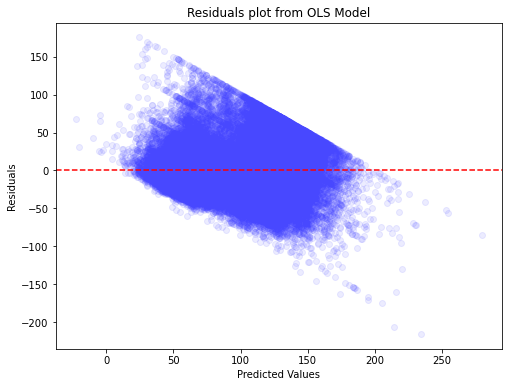

In [120]:
X = df_pricebelow[['room_type_Entire_homeapt', 'review_scores_location',
                   'review_scores_value','accommodates', 'review_scores_cleanliness',
                   'Ave_Housing_borough_2017','review_scores_communication', 'review_scores_checkin',
                   'calculated_host_listings_count','Fare_Zone', 'beds', 'host_acceptance_rate',
                   'reviews_per_month', 'review_scores_rating']]
y = df_pricebelow['price']

# Adding a constant term for the intercept
X = sm.add_constant(X)

# Fitting the Ordinary Least Squares (OLS) model
model = sm.OLS(y, X).fit()

# Plotting the residuals vs the fitted values
plt.figure(figsize=(8, 6))
plt.scatter(model.fittedvalues, model.resid, alpha=0.1)
plt.title('Residuals plot from OLS Model')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.axhline(y=0, color='r', linestyle='--')  # Adding a horizontal line at 0 for reference
plt.show()

The residual plot is a chart that displays the difference between the predicted values and the actual values. The ideal residual plot would show a random distribution of residual values around the zero line. However, if the residuals show a pattern that fans out as the predicted values increase, it indicates that the model's accuracy reduces at higher values. The residual plot also shows a cone-like pattern that gets broader at higher values, which further reinforces the presence of heteroscedasticity and the need for reevaluation or adjustment of the model.

Lastly, we plot the predicted prices by the model and the actual prices in the Dataset 1 to visualise the precision.

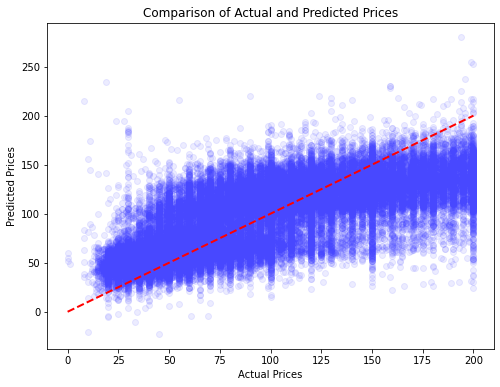

In [119]:
# Predicted prices
predicted_prices = model.fittedvalues
 
# Actual prices
actual_prices = y
 
# Plotting the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(actual_prices, predicted_prices, alpha=0.1)
plt.title('Comparison of Actual and Predicted Prices')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.plot([actual_prices.min(), actual_prices.max()], 
         [actual_prices.min(),actual_prices.max()], 'k--', lw=2, color='r')
plt.show()

The scatter plot illustrates the regression model's accuracy in predicting property prices, with a red dashed line serving as a visual indicator of perfect agreement between predicted and actual values. Notably, the plot reveals that the model's accuracy declines as we move towards higher-priced properties, with more significant prediction errors becoming obvious. Conversely, at lower prices, the model's predictions demonstrate a closer alignment with actual prices due to the high density of data points in this range.

## Objective 4 

## 4-1: Mapping Airbnb Diversity

Explore London's Boroughs on an Interactive Geographic Display.

In [1]:
# # Creating a base map
# m = folium.Map(location=[51.5074, -0.1278], zoom_start=11)
# # Creating a MarkerCluster
# m_rooms_map = plugins.MarkerCluster().add_to(m)

# # Most price lies below 150 per night 
# df_interactive = df.copy()
# df_interactive = df_interactive[df_interactive['price']<150]

# # Iterating through the DataFrame to add markers
# for lat, lon, property_info, price in zip(df_interactive.latitude,
#                                           df_interactive.longitude, 
#                                           df_interactive.name, 
#                                           df_interactive.price):
#     # Splitting the property_info string by "·"
#     parts = [part.strip() for part in property_info.split("·")]
#     # Extracting details based on the available parts
#     name = parts[0] if len(parts) > 0 else ""
#     rating = parts[1].strip('★') if len(parts) > 1 else ""
#     features = " · ".join(parts[2:]) if len(parts) > 2 else ""

#     popup_content = f"""
#     <div style="font-family: Arial, sans-serif; color: #333333; font-size: 14px;">
#         <strong>Name:</strong> {name}<br>
#         <strong>Rating:</strong> ★{rating}<br>
#         <strong>Price:</strong> {price}<br>
#         <strong>Feature:</strong> {features}
#     </div>
#     """
#     # Adding the marker with the customized popup and increased width
#     folium.Marker(location=[lat, lon], icon=folium.Icon(icon="home"),
#                   popup=folium.Popup(popup_content, max_width=300, 
#                                      parse_html=False)).add_to(m_rooms_map)

# #Adding MarkerCluster to the map
# m.add_child(m_rooms_map)
# # Displaying the map
# m

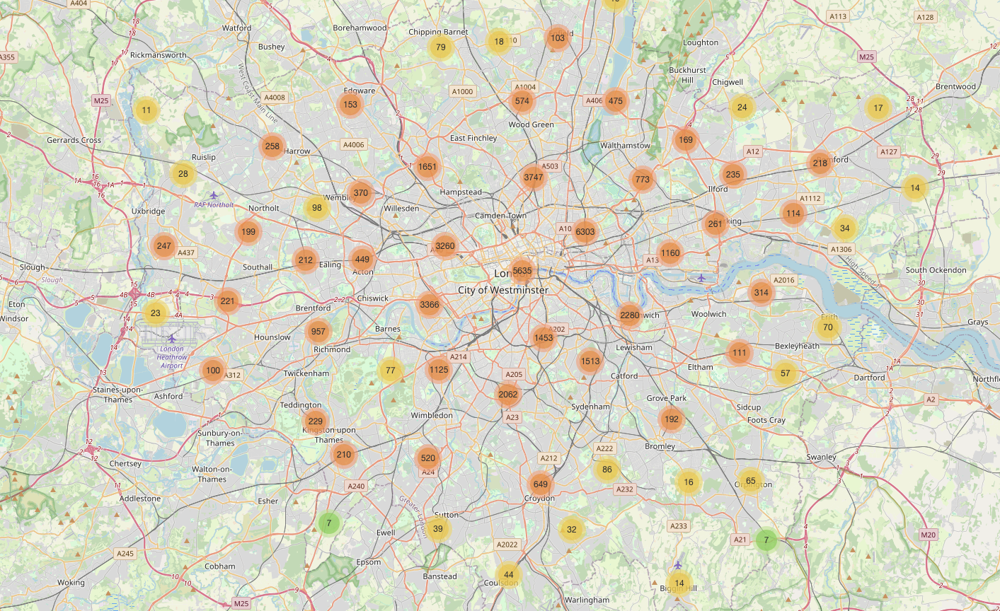

Key Features:
 
Location-Based Insights:
The map shows property listings at their exact geographical locations, hosts may examine how different neighbourhoods and boroughs are distributed physically in London.
 
Detailed Property Information:
Every point on the map denotes an Airbnb property listing and includes relevant details including the name of the property, user rating, and key characteristics. Hosts can quickly review each listing's features by clickling on point.
 
Marker Clustering:
We've used marker clustering to improve the map's readability. This feature compiles listings that are close together, giving a clear picture of the concentration of Airbnb properties in a certain location.
 
This interactive map is a useful resource for anybody looking to browse London's Airbnb home listings. Hosts may utilise this map to explore properties in different London boroughs to review the price of their properties.

## 4-2: Creating Heatmap of Price Distribution

Presents pricing distribution of Airbnb listings across London boroughs.

In [2]:
# # Creating a base map
# m = folium.Map(location=[51.5074, -0.1278], zoom_start=11)
 
# # Creating a heatmap layer
# heat_data = [[lat, lon, price] for lat, lon, price in zip(df_interactive.latitude,
#                                                           df_interactive.longitude,
#                                                           df_interactive.price)]
 
# plugins.HeatMap(heat_data, gradient={0.2: 'blue', 0.4: 'cyan',
#                                      0.6: 'lime', 0.8: 'yellow', 1: 'red'}, radius=15).add_to(m)
 
# # Display the map
# m

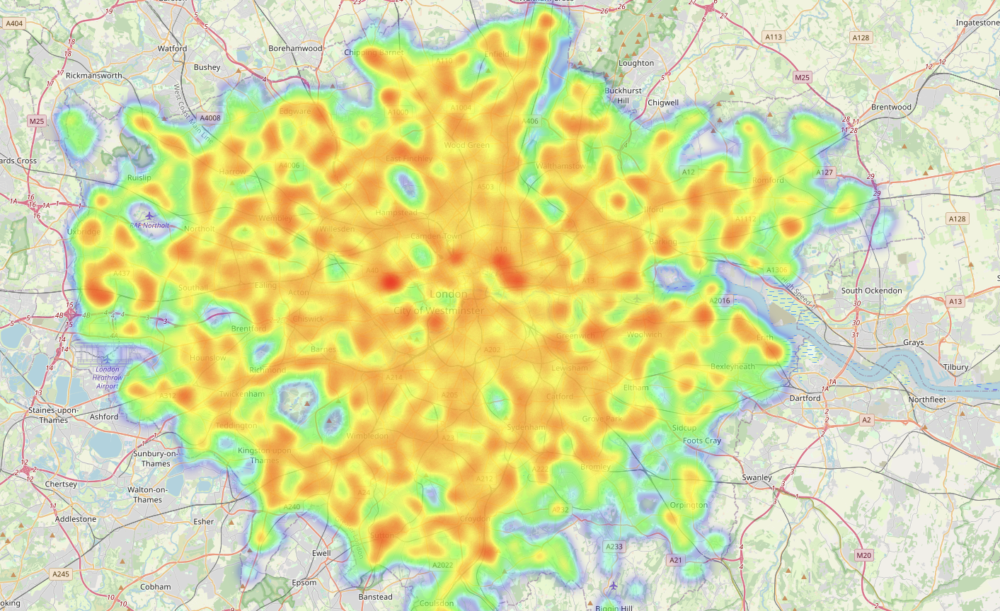

The heatmap represents the locations of property listings in London along with their prices in an interactive way. 
The colour intensity in this heatmap represents the magnitude of the price of listings, ranging from blue to red. It should be noted that areas with a high density of properties will also be shown in red on the map. This means that the colour red represents either high property prices or a high concentration of properties in the area. Also, the interactive visualisation allows users to explore specific areas more closely and get a better understanding of the data.  
 
The heatmap shows the pricing distribution across London boroughs, showing areas close to the city centre are more expensive and suburbs are less expensive. In particular, the areas around major terminal stations, such as London King’s Cross Station, are recognised as hotspots, meaning that highly-priced properties are concentrated in this area. This can be attributed to their geographical locations, including the high accessibility and abundance of tourist attractions in the area. It confirms that the high-pricing strategy is being adopted due to the high demand in such convenient areas.



<br>

# Project Outcome

## Overview of Results 
The primary focus of this study's exploration of "Inside Airbnb" data was "listings.csv" (dataset 1), which contained 87,946 rentals in London. The first objective involved a thorough cleaning of the data, elimination of unnecessary columns, correction of missing values, and ensuring data integrity. Binary mapping is demonstrated by the 'room_type' column, while 'price' was converted to a numeric format. By integrating external information (datasets 3 and 4), pricing and spatial dynamics understanding were improved by the new insights on fare zones and average housing prices. Analysing reviews (dataset 2) revealed a substantial relationship between sentiment scores and ratings, which might help hosts improve the quality of their accommodations. Using a multiple linear regression model, Objective 3 demonstrated how different characteristics, such as room type and review scores, affect rental pricing. In summary, Objective 4 provided hosts with essential insights into listing distribution and pricing dynamics by introducing interactive maps and heatmaps. These tools help prospective investors and present hosts make strategic decisions for competitive pricing and property optimisation, which increases the attractiveness of the property and its potential revenue.

## Result of Objective 1
### Explanation
87,946 Airbnb listings in London were covered extensively in dataset1, "listings.csv," which was obtained from "Inside Airbnb," for the project's first phase. This dataset, which was gathered on September 6, 2023, included 75 columns that were divided into four categories: property basics, host information, geographic coordinates, and details of the property's accommodations. Managing a large number of missing values was a major challenge.  Columns unrelated to the project's objectives were eliminated in order to simplify the dataset for Objective 1, and any missing values were filled in using the proper imputation techniques. In particular, the most common date, "2017-05-07," was used in place of the 'host_since' NaN values. Duplicate items were removed to preserve data integrity, and binary mapping was used to convert the 'room_type' column into binary categories.
 
Additional changes included imputing missing values using the means of several fields and turning the "price" column to a floating point number. A 'top_20_facility' column was added to promote properties with certain facilities. The analytical scope was enlarged by integration with datasets 4 and 3, which contained information on average house prices and the fare zone, respectively. The "OA11CD" field made it easier to connect fare categories with geographical data.
 
Data reduction based on dates and restricting comments to English exclusively were used to overcome processing difficulties in dataset 2, which was noted for its enormous size of 1,581,033 rows. This guaranteed consistency and accuracy of the data for later research.
 
To summarise, the first objective of the project required significant data organisation and cleansing in order to convert unstructured Airbnb data into a format that could be analysed with insight for subsequent goals. The quality of the dataset was improved and a strong basis for further analysis and insights was established by the careful management of missing values, the elimination of superfluous columns, and the integration of additional datasets.
### Visualisation

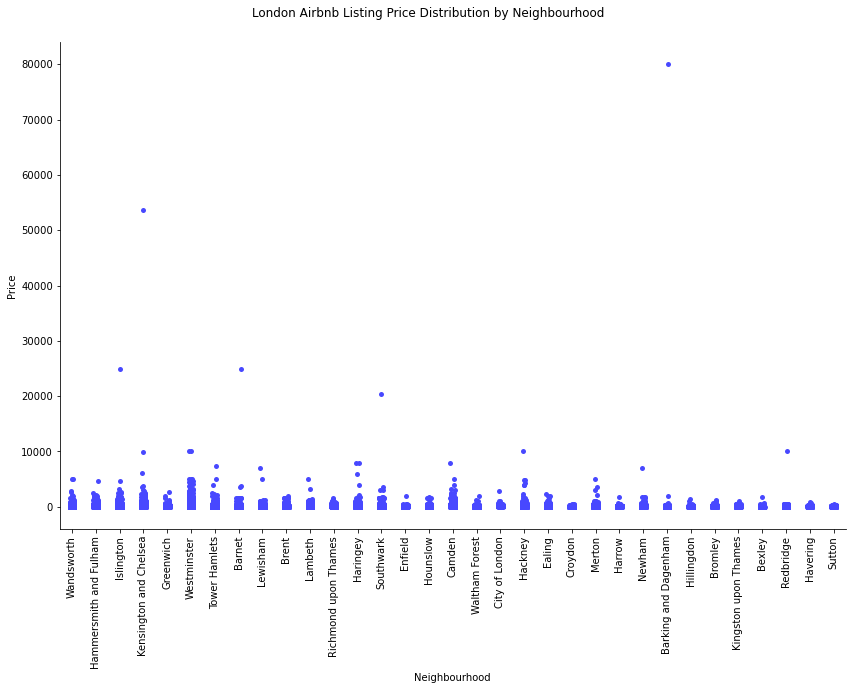

In [152]:
# Set your desired figure size (e.g., figsize=(12, 8))
fig_size = (12, 8)
 
# Create the catplot with the specified figure size
fig_pop = sns.catplot( data=df, x='neighbourhood_cleansed', y='price', aspect=1.5,
    height=fig_size[1], legend=False)
# Set the axis labels and title
fig_pop.set_axis_labels("Neighbourhood", "Price")
fig_pop.fig.suptitle("London Airbnb Listing Price Distribution by Neighbourhood")
 
# Rotate x-axis labels and adjust layout
fig_pop.set_xticklabels(rotation=90)
fig_pop.fig.subplots_adjust(top=0.92)
 
# Show the plot
plt.show()

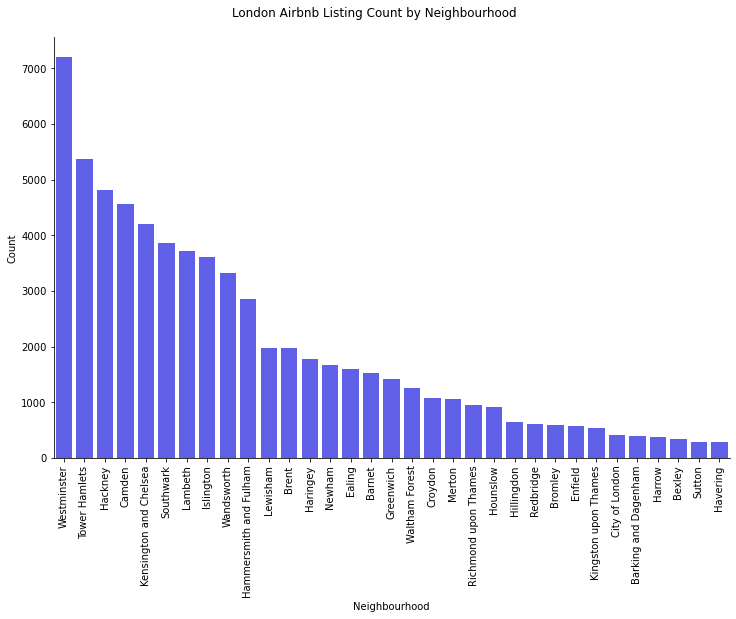

In [162]:
neighbourhood_counts = df['neighbourhood_cleansed'].value_counts().sort_values(ascending=False)
 
# Create the catplot with the sorted order of neighbourhoods
fig_pop = sns.catplot(data=df, x='neighbourhood_cleansed', kind='count', aspect=1.5, 
                      order=neighbourhood_counts.index, legend=False, height=7)
 
# Set the axis labels and title
fig_pop.set_axis_labels("Neighbourhood", "Count")
fig_pop.fig.suptitle("London Airbnb Listing Count by Neighbourhood")
 
# Rotate the x-axis labels to make them readable
fig_pop.set_xticklabels(rotation=90)
# To adjust the title position and avoid overlapping with the plot
fig_pop.fig.subplots_adjust(top=0.92)
 
plt.show()

## Result of Objective 2
### Explanation
The analysis of reviews on Airbnb reveals a significant relationship between ratings and sentiment scores. Positive scores predominate in higher ratings (3-5), whereas negative scores are concentrated in lower ratings (0–2). Negative keywords like "dirty" and "shower" contrast with top positive keywords like "great," "clean," and "nice," which express negative feelings. Positive word clouds highlight helpfulness and cleanliness, while negative clouds highlight problems with facilities and hygiene. Topics 0 and 4 highlight comfort, Topics 1 and 2 focus on location and happy recollections, while Topic 4 exposes hygiene issues. Gensim topic modelling shows themes. Host may improve lodgings and increase visitor happiness with the help of these insights.
### Visualisation


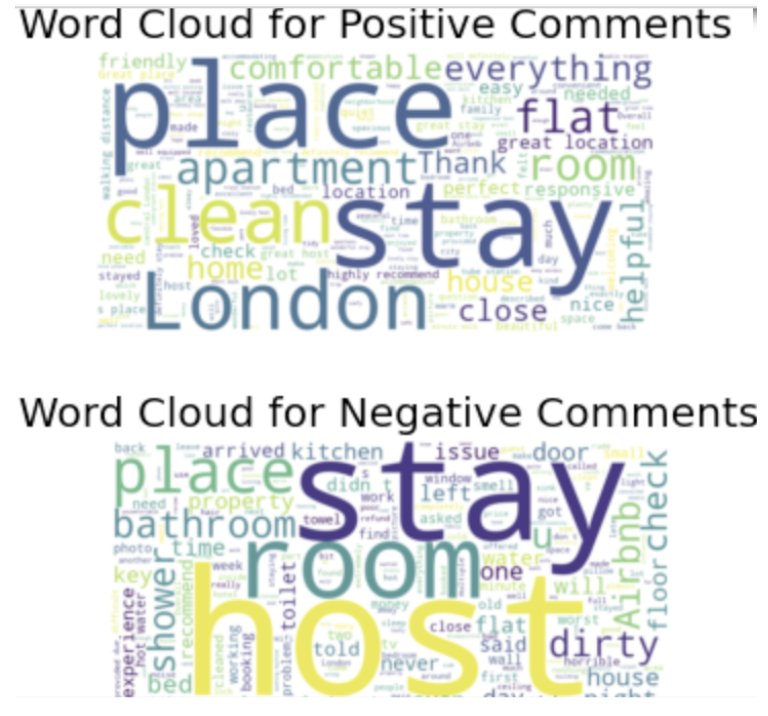

## Result of Objective 3
### Explanation
Our research aimed to identify critical elements influencing London Airbnb property pricing in order to achieve Objective 3. We investigated a wide range of independent factors, such as room type, review scores, average housing prices in the vicinity, and fare zones, by utilising a strong multiple linear regression model. The results of this analytical effort were insightful, emphasising the importance of certain factors—most notably, review scores for value, cleanliness, and location.
 
In a output there was a positive association between the pricing of houses that received better review rankings for cleanliness and location.The model revealed a valuable insight into strategic pricing: hosts who consistently obtain favourable reviews can deliberately raise the price of their properties. With this calculated change, their home is now competitively placed in the broader London market.
 
Additionally, the model suggested that homes with larger guest capacities or those that are accessible for private rental without communal areas would fetch higher pricing points. Hosts may carefully adjust costs based on particular property characteristics and accommodations due to this analytical correlation.
 
In conclusion, the model developed in objective 3 is a valuable resource for hosts, providing practical insights for pricing strategy optimisation. Hosts may carefully leverage good ratings and guest preferences to improve their property's competitiveness and meet particular visitor desires.  The results enable hosts to make well-informed choices, resulting in a profitable and favourable Airbnb hosting experience in the ever-evolving London market.
### Visualisation

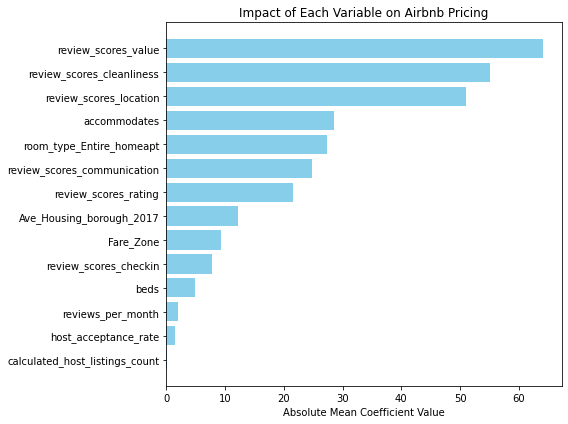

In [118]:
# Sorting the DataFrame by 'abs_mean_coef' in descending order
sorted_abs_coefficients = coefficients.sort_values('abs_mean_coef', ascending=False)
 
# Plot the sorted absolute mean coefficient values.
plt.figure(figsize=(8, 6))
plt.barh(sorted_abs_coefficients['variable'], sorted_abs_coefficients['abs_mean_coef'],
         color='skyblue')
plt.xlabel('Absolute Mean Coefficient Value')
plt.title('Impact of Each Variable on Airbnb Pricing')
plt.gca().invert_yaxis()  # Invert y-axis to have the largest bar on top
plt.tight_layout()
plt.show()

## Result of Objective 4
### Explanation
The aim of Objective 4 was to create interactive map tools that would show the distribution of Airbnb property listings in London and provide valuable insights to hosts. To achieve this, two maps were created: an interactive map of the diversity of listings and a price distribution heatmap. These maps display how listings are spread out and the prices set for different property attributes. Hosts can easily access this information for their areas of concern, as well as view the road and rail networks presented with the base map.
The interactive map and heatmap show that the city centre has more listings and higher prices compared to suburban areas, which have fewer and lower-priced listings. The city centre, especially the area around London King's Cross Station, is highly accessible and has numerous tourist attractions, making it a preferred location for lodgment. This high demand results in more competitive listings in the area, with higher prices. In addition, the area near London Heathrow Airport has many listings with higher prices even though it is on the outskirts. This can be attributed to the high demand from airport users. As such, the heatmap helps to identify hotspots with high demand due to significant public facilities.
In summary, these handy maps allow hosts to explore the listings in their property's neighbourhood and gain insights on how to adjust their pricing strategy to increase profits or make their property more attractive to potential guests. Additionally, if a host plans to purchase a new property to lease out on Airbnb, these tools can also help identify high-potential areas.
### Visualisation

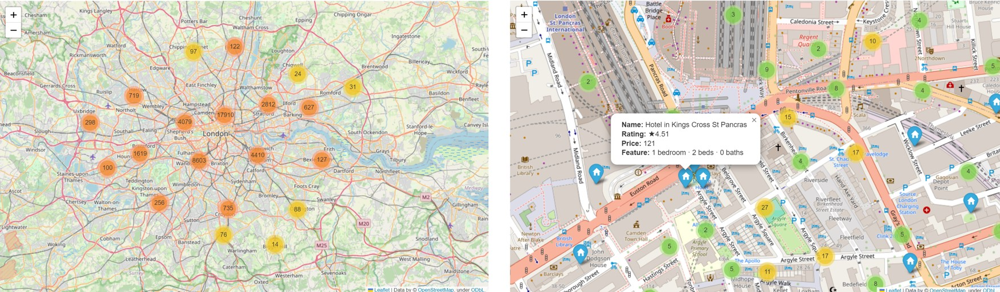

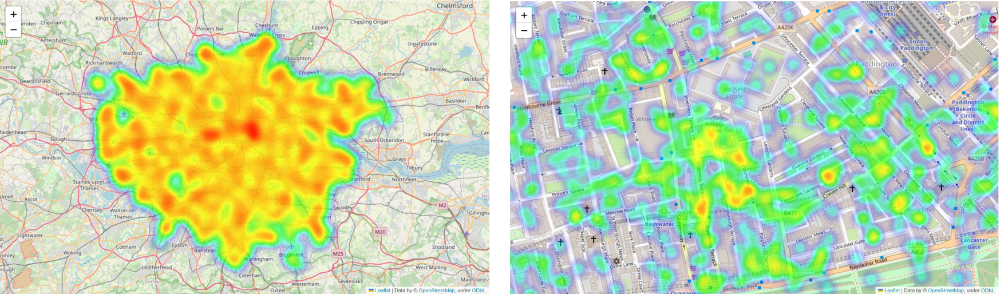

# Conclusion

### Achievements:
Project accomplishments include converting categorical data for faster analysis, fixing duplicates and missing information, and altering 87,946 Airbnb listings in London. The robust database allowed for careful investigation. The research was improved by integration with other datasets, such as information on fare zones and average housing values by borough. We performed an efficient analysis of 1,581,033 exams by compressing the data using date-related reduction and English comments. The results showed a complex relationship between comment sentiments and ratings, giving hosts more influence over how well their guests is treated.  The successful completion of Objective 3 resulted in an efficient multiple linear regression model that identified factors influencing Airbnb property values, such as location and cleanliness review scores. Positive evaluations evolved into a calculated approach for affordable prices. With the use of Objective 4's interactive maps, hosts were able to discover high-potential real estate locations and facilitate optimised pricing by gaining visual insights into listing distribution and price patterns. In the dynamic London market, the initiative provides hosts of Airbnb with useful tools and information.

### Limitations:
The study ran into issues, such as large amounts of blank values in several columns of the Airbnb dataset, which raised questions about possible bias. Furthermore, temporal constraints emerged since, although dataset 3 on home prices covered data only until 2017, this may influence the prediction pricing models' performance because it ignored developments in the market after 2017.
 
Sentiment Analysis Challenges: The large dataset size risked temporal bias, and computational limits led to data truncation, reducing analysis depth. Excluding non-English comments may have also narrowed the range of guest perspectives.
 
Ratings Subjectivity and Reviewer Bias: The lack of standardization in customer review ratings resulted in subjective data. Reviews were biased, predominantly from guests with extreme experiences, thus not fully representing the range of guest experiences. Addressing these limitations in future work will help enhance the analysis of customer reviews and more accurately identify factors influencing Airbnb property prices.

### Future Work:

We want to improve our data analysis in the future by including data from other sources, such as economic indicators and accessibility to transportation. Deep learning and other cutting-edge natural language processing methods will be used to improve sentiment analysis. To provide accurate pricing forecasts, we hope to explore consumer demographics using advanced machine learning models such as neural networks or random forests. To give Airbnb hosts a more complete picture of our interactive map, our proposal includes integrating other data layers, such as economic indicators and transit accessibility measurements.